# <CENTER> **PROJECT: Scintillation Detector**

---

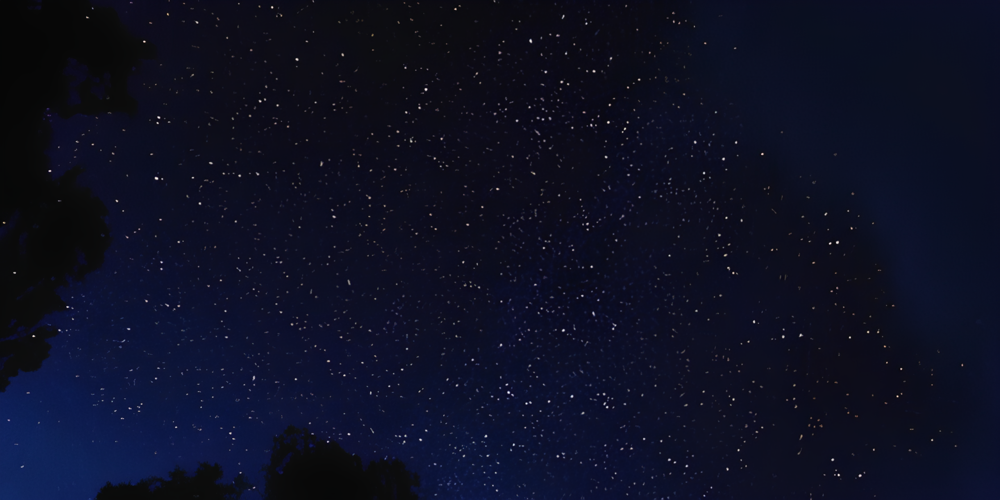

---

#### **Описание:**

В некоторых веществах в результате прохождения через них заряженных частиц возникают короткие вспышки света – **сцинтилляции**. Вещества, излучающие свет под действием ионизирующего излучения, называют **сцинтилляторами**.

Сцинтилляции отличны от остальных видов свечения, образующегося во время взаимодействия частиц с веществом тем, что они возникают вследствие электронных переходов внутри так называемых центров свечения. Такими центрами свечения могут служить, например, атомы, ионы, молекулы. Каждая вспышка вызвана отдельной заряженной частицей и состоит из большого количества (10^3 − 10^6) фотонов.

При получении данных, эксперименты с которыми производились в настоящей работе, был использован сцинтилляционный детектор, на основе органических кристаллов паратерфенила. Перспективность сцинтилляторов на основе органических кристаллов паратерфенила в регистрации нейтронного излучения в присутствии гамма-фона обуславливает большое содержание атомов водорода в вышеупомянутых элементах систем детектирования. Вызвано это тем, что для регистрации нейтронов используют эффект упругого рассеяния нейтронов с ядром.

При упругом рассеянии нейтронов на ядрах, наблюдается эффект отдачи кинетической энергии. Таким образом, вещество, из которого должен быть сделан сцинтиллятор, выбирается в соответствии с тем требованием, чтобы кинетическая энергия была максимально возможной. Наибольшее значение данной энергии наблюдается для ядер водорода.
Именно поэтому высокое содержание водорода в используемом сцинтилляторе играет весомую роль в процессе детектирования излучения, содержащего в себе нейтроны.

---

#### **Постановка задачи:**

Даны данные о **23 479** сигналах с различных набором характеристик этих сигналов. В данной работе необходимо кластеризовать эти сигналы на **три** кластера по типу сигналов: два кластера отображают типы сигналов (гамма-кванты или нейтроны), третий кластер представляет себя группу сигналов, которые не поддаются кластеризации. (Нумерация кластеров с 0: 0,1,2).

---


#### **Основные цели:**

* Сформировать набор данных на основе предоставленных источников информации;

* Спроектировать новые признаки с помощью *Feature Engineering* и выявить наиболее значимые при построении модели;

* Исследовать предоставленные данные и выявить закономерности;

* Построить несколько моделей и выбрать из них ту, которая показывает наилучший результат по заданной метрике.

---


#### **Этапы работы над проектом:**

Проект будет состоять из восьми частей:

`1.` *Базовый анализ и знакомство с данными*;

`2.` *Очистка данных*;

`3.` *Разведывательный анализ данных (EDA)*;

`4.` *Feature engineering (Создание новых признаков)*;

`5.` *Отбор признаков*;

`6.` *Machine Learning (clustering)*;

`7.` *Machine Learning (classical)*;

`8.` *Вывод*.

---

**Импортируем необходимые библиотеки:**

In [1]:
# Для работы с данными
import numpy as np
import pandas as pd
from scipy.fft import fft, fftfreq
from scipy import  stats
from scipy import fft
from math import pi
from imblearn import over_sampling


# Для построения графиков
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots


# Для построения моделей
from sklearn import  manifold
from sklearn import preprocessing
from sklearn import feature_selection
from sklearn import model_selection
from sklearn import metrics
from sklearn import cluster
from sklearn import pipeline
from sklearn import mixture
from sklearn import decomposition
from sklearn import neighbors
from sklearn import ensemble
from scipy.cluster.hierarchy import dendrogram, linkage


# Для сохранения модели
import joblib

**Загрузка данных:**

In [2]:
# Загружаем данные
SD_data = pd.read_csv(
    'data/Run200_Wave_0_1.txt',
    header = None,
    skipinitialspace = True,
    sep = ' '
)

# Удаляем строки с NaN
SD_data = SD_data.drop([0, 1, 2, 504], axis = 1)

# Переименовываем столбцы
SD_data.columns = list(range(501)) 



# Создаём копию
SD_df = SD_data.copy()

## <CENTER> **`1.` Базовый анализ и знакомство с данными**

На данном этапе изучим информацию предоставленных данных.

#### $1.1$

Выведем информацию по таблице:

In [ ]:
# Создадим функцию для вывода информации по датасету
def check_data_inf(data, length1 = None, length2 = None):
    
    # Выводим размеры таблицы
    print('Данные имеют следующую размерность:\n')
    print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(data.shape[0], data.shape[1]))
    print('-' * length1)

    # Выведем первые пять строк 
    display(data.head())
    print('-' * length2)
    
    
    
# Выводим информацию по DataFrame при помощи функции 'check_data_inf'
check_data_inf(
    data = SD_df,
    length1 = 40,
    length2 = 150
)

Данные имеют следующую размерность:

Количество строк: 23479;
Количество признаков (столбцов): 501.
----------------------------------------


,0,1,2,3,4,5,6,7,8,9,...,491,492,493,494,495,496,497,498,499,500
0,500,14820,14823,14824,14822,14818,14820,14824,14822,14820,...,14828,14822,14815,14815,14817,14819,14820,14822,14820,14819
1,500,14820,14822,14820,14826,14824,14822,14820,14822,14823,...,14828,14817,14824,14822,14824,14819,14820,14819,14822,14820
2,500,14820,14820,14822,14825,14820,14824,14824,14819,14823,...,14820,14821,14820,14820,14818,14821,14823,14820,14820,14821
3,500,14828,14822,14818,14824,14824,14822,14820,14822,14824,...,14824,14826,14822,14821,14820,14828,14820,14822,14823,14822
4,500,14823,14815,14823,14821,14827,14820,14823,14824,14816,...,14820,14820,14823,14828,14824,14820,14824,14824,14822,14825


------------------------------------------------------------------------------------------------------------------------------------------------------


#### **Основные характеристики:**



---

#### $1.2$

Выведем информацию по признакам:

In [4]:
# Вывод таблицы
SD_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23479 entries, 0 to 23478
Columns: 501 entries, 0 to 500
dtypes: int64(501)
memory usage: 89.7 MB


Подсчитаем количество по типам признаков:

In [5]:
# Подсчет количества признаков типа 'object', 'int64' и 'float64'      
object_columns_count = SD_df.select_dtypes(include = ['object']).shape[1]
int64_columns_count = SD_df.select_dtypes(include = ['int64']).shape[1]
float64_columns_count = SD_df.select_dtypes(include = ['float64']).shape[1]



# Вывод результата
print('В данных представлены признаки следующих типов:')
print('-' * 50)
print()

print(f"Количество признаков типа 'object': {object_columns_count}")
print(f"Количество признаков типа 'int64': {int64_columns_count}")
print(f"Количество признаков типа 'float64': {float64_columns_count}")

В данных представлены признаки следующих типов:
--------------------------------------------------

Количество признаков типа 'object': 0
Количество признаков типа 'int64': 501
Количество признаков типа 'float64': 0


#### $1.3$

Выведем описательные характеристики по признакам:

In [6]:
# Вывод таблицы
SD_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,491,492,493,494,495,496,497,498,499,500
count,23479.0,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,...,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000,23479.000000
mean,500.0,14822.972316,14822.958474,14822.970016,14822.989991,14823.003961,14822.978619,14822.968610,14822.954470,14822.963670,...,14822.329017,14822.315686,14822.272073,14822.171728,14822.257123,14822.317092,14822.279399,14822.278163,14822.287789,14822.283743
std,0.0,2.805884,2.833516,2.840755,2.852066,2.833412,2.836271,2.831241,2.827526,2.846291,...,3.357997,3.373568,3.340707,3.332547,3.290301,3.232245,3.268458,3.251192,3.253340,3.242307
min,500.0,14812.000000,14812.000000,14812.000000,14811.000000,14812.000000,14812.000000,14812.000000,14811.000000,14812.000000,...,14800.000000,14798.000000,14802.000000,14796.000000,14802.000000,14801.000000,14798.000000,14804.000000,14800.000000,14802.000000
25%,500.0,14821.000000,14821.000000,14821.000000,14821.000000,14821.000000,14821.000000,14821.000000,14821.000000,14821.000000,...,14820.000000,14820.000000,14820.000000,14820.000000,14820.000000,14820.000000,14820.000000,14820.000000,14820.000000,14820.000000
50%,500.0,14823.000000,14823.000000,14823.000000,14823.000000,14823.000000,14823.000000,14823.000000,14823.000000,14823.000000,...,14823.000000,14823.000000,14823.000000,14822.000000,14823.000000,14823.000000,14823.000000,14823.000000,14823.000000,14823.000000
75%,500.0,14824.000000,14824.000000,14825.000000,14825.000000,14825.000000,14824.000000,14824.000000,14824.000000,14824.000000,...,14824.000000,14824.000000,14824.000000,14824.000000,14824.000000,14824.000000,14824.000000,14824.000000,14824.000000,14824.000000
max,500.0,14834.000000,14835.000000,14834.000000,14835.000000,14834.000000,14835.000000,14835.000000,14833.000000,14834.000000,...,14836.000000,14835.000000,14834.000000,14836.000000,14833.000000,14834.000000,14833.000000,14834.000000,14833.000000,14835.000000


## <CENTER> **`2.` Очистка данных**

На данном этапе выявим и очистим данные от пропусков, дубликатов и выбрасов.

#### $2.1$

**Проверим данные на наличие пропусков:**

In [7]:
# Выводим суммарное количество пропусков
print('Суммарное количество пропусков в данных: {}\n'.format(SD_df.isnull().sum().sum()))
print('-' * 50)


# Выводим признаки с сумрным количеством пропусков
print('Информация по количествам пропусков: \n\n{} \n'.format(SD_df.isnull().sum()))
print('-' * 50)


# Рассчитываем количество пропусков
cols_null_persent = SD_df.isnull().mean() * 100
cols_with_null = cols_null_persent[cols_null_persent > 0].sort_values(ascending = False)
print(f'Информация по количествам пропусков в процентах:\n\n{cols_with_null}')
print('-' * 50)

Суммарное количество пропусков в данных: 0

--------------------------------------------------
Информация по количествам пропусков: 

0      0
1      0
2      0
3      0
4      0
      ..
496    0
497    0
498    0
499    0
500    0
Length: 501, dtype: int64 

--------------------------------------------------
Информация по количествам пропусков в процентах:

Series([], dtype: float64)
--------------------------------------------------


**Вывод:**

По полученным данным видно, что пропуски отсутствуют.

#### $2.2$

**Проверяем данные на наличие дубликатов:**

In [8]:
# Создаём список признаков
dupl_columns = list(SD_df.columns)


# Создаём маску дубликатов с помощью метода duplicated() и произведём фильтрацию
mask = SD_df.duplicated(subset = dupl_columns)
train_duplicates = SD_df[mask]
print(f'Число найденных дубликатов: {train_duplicates.shape[0]}')

Число найденных дубликатов: 0


#### $2.3$

**Проверяем данные на наличие выбросов.**

Создадим список признаков с возможными выбросами:

In [9]:
# Создание списка признаков типа 'int64' и 'float64'
numeric_columns = SD_df.select_dtypes(include = ['int64', 'float64']).columns.tolist()

Создадим функцию для поиска выбросов:

In [10]:
# Функция для поиска выбросов через IQR
def detect_outliers_iqr(data, features):
    
    # Создаём словарь, ключами которого будут индексы признаков,
    # а значениями - их количество
    outliers_dict = {}
    
    
    # Пройдёмся циклом for по признакам
    for feature in features:
        
        # Рассчитаем первый и третий квартиль, а также межквартильный размах
        Q1 = data[feature].quantile(0.25)         # первый квартиль
        Q3 = data[feature].quantile(0.75)         # третий квартиль
        IQR = Q3 - Q1                             # межквартильный размах
        
        # Границы (нижняя и верхняя) для определения выбросов
        lower_bound = Q1 - 1.5 * IQR    
        upper_bound = Q3 + 1.5 * IQR   
        
        # Поиск выбросов
        outliers_dict[feature] = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)][feature]  
        
    return outliers_dict

Организуем поиск выбросов:

In [11]:
# Создаём переменную, в котором будем хранить признаки с количеством выбросов
outliers = detect_outliers_iqr(
    data = SD_df,
    features = numeric_columns
)


# Вывод выбросов
for feature, values in outliers.items():   
    print('"{}":   количество выбросов в признаке: {}'.format(feature, len(values)))
    print('-' * 55)
    print()

"0":   количество выбросов в признаке: 0
-------------------------------------------------------

"1":   количество выбросов в признаке: 491
-------------------------------------------------------

"2":   количество выбросов в признаке: 539
-------------------------------------------------------

"3":   количество выбросов в признаке: 49
-------------------------------------------------------

"4":   количество выбросов в признаке: 54
-------------------------------------------------------

"5":   количество выбросов в признаке: 48
-------------------------------------------------------

"6":   количество выбросов в признаке: 538
-------------------------------------------------------

"7":   количество выбросов в признаке: 540
-------------------------------------------------------

"8":   количество выбросов в признаке: 490
-------------------------------------------------------

"9":   количество выбросов в признаке: 543
-------------------------------------------------------

"10":

Построим визуализацию для нескольких признаков:

------------------------------------------------------------------------------------------------------------------------------------------------------
Гистограмма для выбранных признаков:


C:\Users\User\AppData\Local\Temp\ipykernel_11868\867037497.py:29: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(fontsize = 15)                           # размер шрифта для легенды


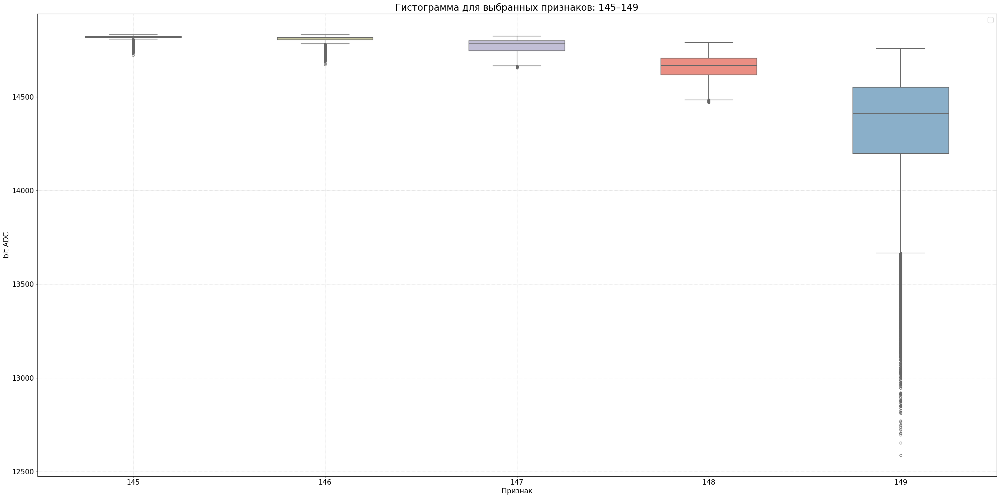

In [12]:
# Выбираем несколько признаков с большим числом выбросов (например, 145–149)
selected_features = [145, 146, 147, 148, 149]



# Создаём заголовок для графика
print('-' * 150)
print('Гистограмма для выбранных признаков:')

# Зададим размер графика
plt.rcParams['figure.figsize'] = (30, 15)

# Создаём график
sns.boxplot(
    data = SD_df.iloc[:, selected_features],
    palette = 'Set3',                               # цветовая палитра
    linewidth = 1.5,                                # толщина линий
    fliersize = 5,                                  # размер выбросов
    width = 0.5                                     # ширина ящиков
)

# Задаём заголовок графика
plt.title('Гистограмма для выбранных признаков: 145–149', fontsize = 20)
plt.xlabel('Признак', fontsize = 15)
plt.ylabel('bit ADC', fontsize = 15)
plt.xticks(fontsize = 15)                           # размер шрифта для подписей по оси X
plt.yticks(fontsize = 15)                           # размер шрифта для подписей по оси Y
plt.grid(True, linestyle = '--', linewidth = 0.5) 
plt.legend(fontsize = 15)                           # размер шрифта для легенды
plt.tight_layout()                                  # автоматическая подгонка графика
plt.show()                                          # вывод графика на экран

Теперь отдельно построим визуализацию для признака `145`:

------------------------------------------------------------------------------------------------------------------------------------------------------
Гистограмма для выбранных признаков:


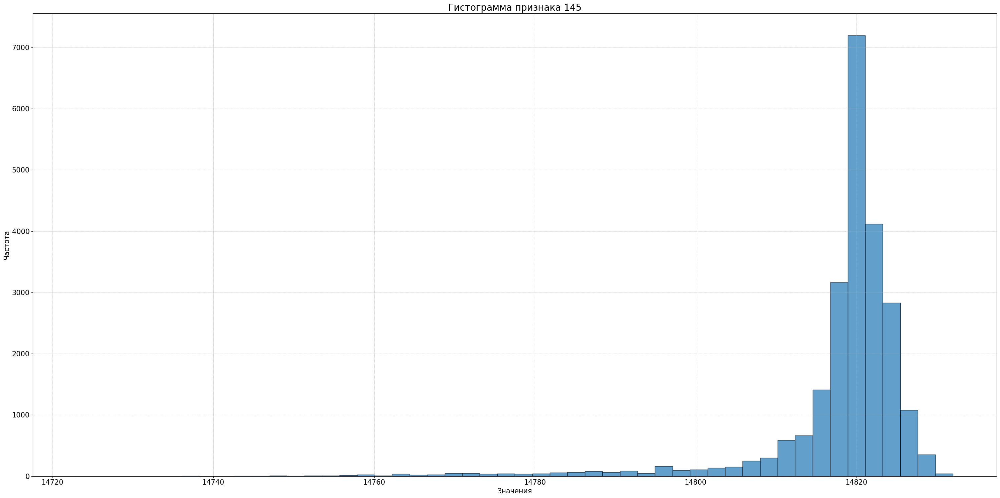

------------------------------------------------------------------------------------------------------------------------------------------------------
"Boxplot" для выбранных признаков:


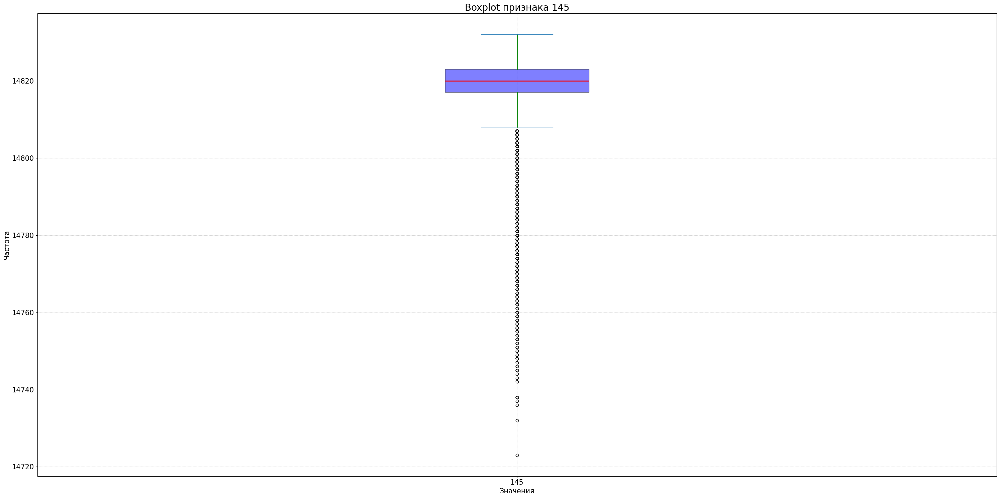

In [ ]:
# Создаём заголовок для графика
print('-' * 150)
print('Столбчатая диаграмма для признака 145:')

# Зададим размер графиков
plt.rcParams['figure.figsize'] = (30, 15)

# Создаём график
SD_df.iloc[:, 145].hist(
    bins = 50,
    alpha = 0.7,
    edgecolor = 'black'
)

# Задаём стиль графика
plt.title('Столбчатая диаграмма признака 145', fontsize = 20)
plt.xlabel('Значения', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(axis = 'y', alpha = 0.75)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.grid(True, linestyle = '--', linewidth = 0.5)
plt.tight_layout()
plt.show()




# Создаём заголовок для графика
print('-' * 150)
print('Коробчатая диаграмма для признака 145:')

# Зададим размер графика
plt.rcParams['figure.figsize'] = (30, 15)

# Создаём график
SD_df.iloc[:, 145].plot(
    kind = 'box', 
    grid = True, 
    patch_artist = True, 
    boxprops = dict(facecolor = 'blue', alpha = 0.5),
    medianprops = dict(color = 'red', linewidth = 2),
    whiskerprops = dict(color = 'green', linewidth = 2)
)

# Задаём стиль графика
plt.title('Коробчатая диаграмма признака 145', fontsize = 20)
plt.xlabel('Значения', fontsize = 15)
plt.ylabel('Частота', fontsize = 15)
plt.grid(axis = 'y', alpha = 0.75)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.grid(True, linestyle = '--', linewidth = 0.5)
plt.tight_layout()
plt.show()

**Вывод:**



Применим `PCA` для снижения размерности до *2D* и построим *scatter plot*, чтобы увидеть, есть ли в данных явные кластеры:

------------------------------------------------------------------------------------------------------------------------------------------------------
Точечный график для PCA:


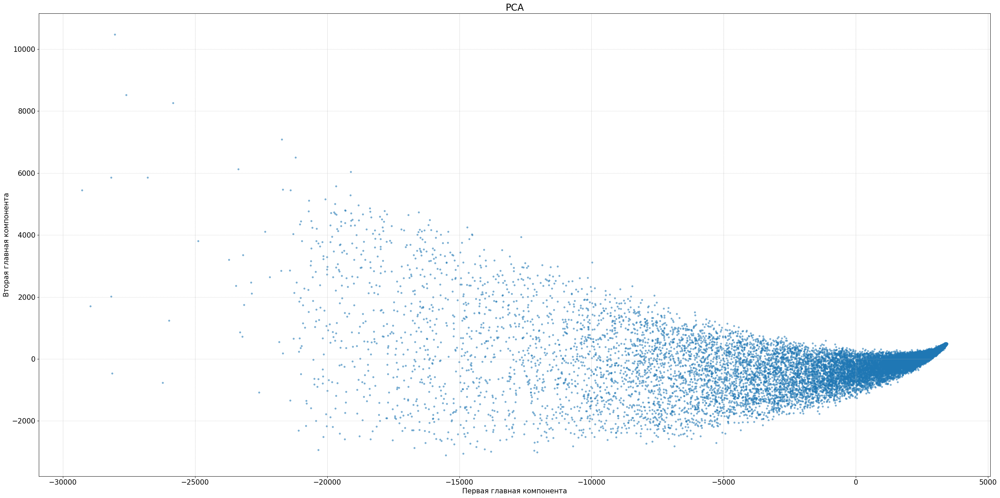

In [14]:
# Уменьшаем размерность с помощью PCA
pca = decomposition.PCA(n_components = 2)

# Применяем PCA к данным
SD_pca = pca.fit_transform(SD_df)



# Создаём заголовок для графика
print('-' * 150)
print('Точечный график для PCA:')

# Зададим размер графика
plt.rcParams['figure.figsize'] = (30, 15)

# Создаём график
plt.scatter(
    SD_pca[:, 0], 
    SD_pca[:, 1], 
    alpha = 0.5, 
    s = 10
)

# Задаём стиль графика
plt.title('PCA', fontsize = 20)
plt.xlabel('Первая главная компонента', fontsize = 15)
plt.ylabel('Вторая главная компонента', fontsize = 15)
plt.grid(axis = 'y', alpha = 0.75)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
plt.grid(True, linestyle = '--', linewidth = 0.5)
plt.tight_layout()
plt.show()

**Вывод:**



Построим график зависимости числа выбросов от номера признака, чтобы увидеть, где они сосредоточены:

------------------------------------------------------------------------------------------------------------------------------------------------------
График с маркерами для значений выбросов:


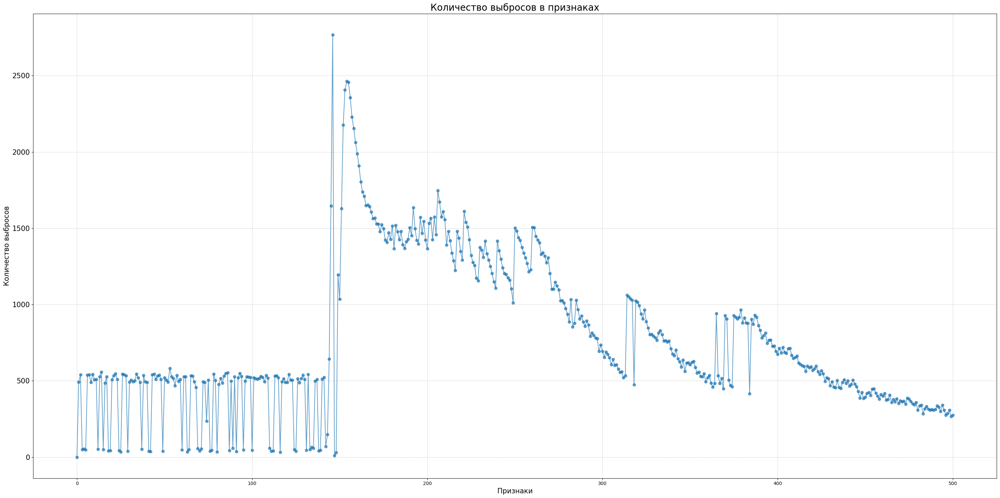

In [20]:
# Создаём заголовок для графика
print('-' * 150)
print('График с маркерами для значений выбросов:')



# Создаём список с количеством выбросов
outliers_list = [len(values) for values in detect_outliers_iqr(SD_df, numeric_columns).values()]

# Зададим размер графика
plt.rcParams['figure.figsize'] = (30, 15)

# Создаём график
plt.plot(
    numeric_columns,
    outliers_list,
    marker = 'o',
    linestyle = '-',
    alpha = 0.7
)

# Задаём стиль графика
plt.title('Количество выбросов в признаках', fontsize = 20)
plt.xlabel('Признаки', fontsize = 15)
plt.ylabel('Количество выбросов', fontsize = 15)
plt.yticks(fontsize = 15)
plt.grid(True, linestyle = '--', linewidth = 0.5)
plt.tight_layout()
plt.show()

**Вывод:**



#### **Общий вывод:**

В данных полностью отсутствуют пропущенные значения а так же дубликаты. Присутствуют выбросы, но, вместо обработки, мы их используем для третьего кластера. Так же все признаки имеют тип `int64` что так же упрощает задачу, так как нет необходимости предобрабатывать категориальные признаки.

## <CENTER> **`3.` Разведывательный анализ данных (EDA)**

В данной части проекта мы:

* изучаем сгенерированный набор данных;

* дополним наш анализ визуализациями, иллюстрирующими исследование.

#### $3.1$

Визуализируем $100$ сигналов (первые 100 строк из `SD_df`) в определённом временном диапазоне (признаки 140–199). Каждый сигнал будет отображаться как отдельная линия на графике:

------------------------------------------------------------------------------------------------------------------------------------------------------
График изменения 100 сигналов во времени


Text(0, 0.5, 'Amplitude (bit ADC)')

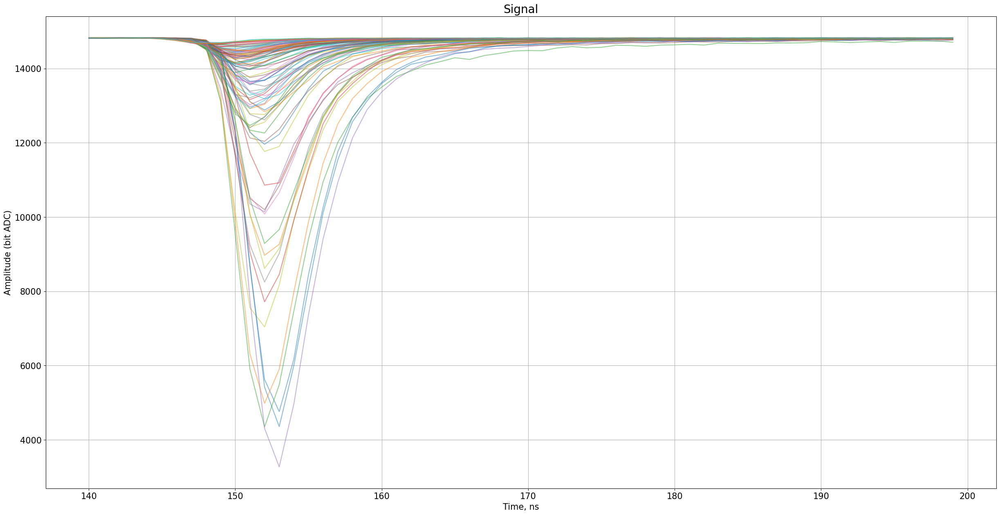

In [21]:
# Создаём заголовок для графика
print('-' * 150)
print('График изменения 100 сигналов во времени')



# Создаём последовательность чисел от 0 до 99
N = range(0, 100)

# Создаём график
ax = SD_df.T[N][140: 200].plot(
    title = 'Signal',
    alpha = 0.5,
    linewidth = 1.5,
    linestyle = '-',
    legend = None,
    grid = True,
    figsize = (30, 15),
    xlabel = 'Time',
    ylabel = 'Amplitude',
    fontsize = 15
)

# Задаём стиль графика
ax.set_title('Signal', fontsize = 20)
ax.set_xlabel('Time, ns', fontsize = 15)
ax.set_ylabel('Amplitude (bit ADC)', fontsize = 15)

Инвертируем сигналы:

------------------------------------------------------------------------------------------------------------------------------------------------------
График изменения 100 сигналов во времени


Text(0, 0.5, 'Amplitude (bit ADC)')

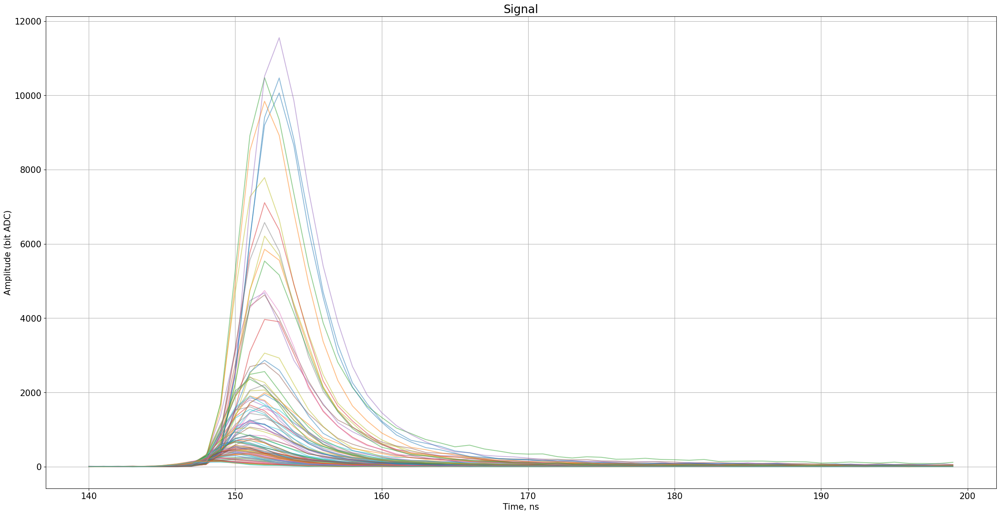

In [22]:
# Создаём заголовок для графика
print('-' * 150)
print('График изменения 100 сигналов во времени')



# Создаём график
ax = (2**14 - SD_df.T[N] - 1560)[140: 200].plot(
    title = 'Signal',
    alpha = 0.5,
    linewidth = 1.5,
    linestyle = '-',
    legend = None,
    grid = True,
    figsize = (30, 15),
    xlabel = 'Time',
    ylabel = 'Amplitude',
    fontsize = 15
)

# Задаём стиль графика
ax.set_title('Signal', fontsize = 20)
ax.set_xlabel('Time, ns', fontsize = 15)
ax.set_ylabel('Amplitude (bit ADC)', fontsize = 15)

**Вывод:**



#### $3.2$

**Визуализация трёхмерного пространства.**

Так как у нас 501 признак, снизим размерность данных до трёх компонент с помощью `PCA` и визуализируем их в *3D*, чтобы увидеть, как данные разделяются по кластерам:

------------------------------------------------------------------------------------------------------------------------------------------------------
График трёхмерного пространства признаков:


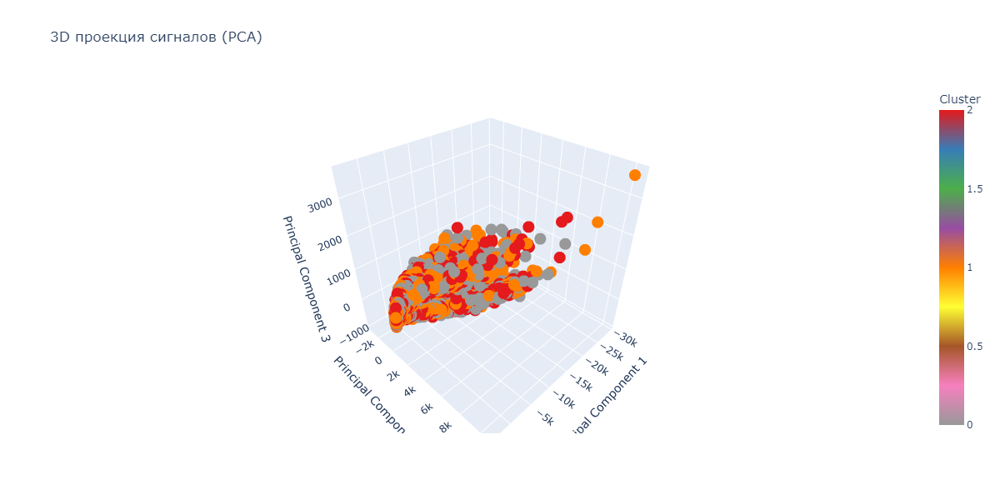

In [14]:
# Создаём заголовок для графика
print('-' * 150)
print('График трёхмерного пространства признаков:')


# Для примера создадим синтетические метки кластеров (0, 1, 2)
np.random.seed(42)
cluster_labels = np.random.choice([0, 1, 2], size = SD_df.shape[0])



# Снижение размерности с помощью PCA до 3 компонент
pca = decomposition.PCA(n_components = 3)
pca_result = pca.fit_transform(SD_df)

# Создаём DataFrame для Plotly
df_3d = pd.DataFrame({
    'PC1': pca_result[:, 0],
    'PC2': pca_result[:, 1],
    'PC3': pca_result[:, 2],
    'Cluster': cluster_labels
})

# Интерактивный 3D scatter plot
fig = px.scatter_3d(
    df_3d, 
    x = 'PC1', 
    y = 'PC2', 
    z = 'PC3', 
    color = 'Cluster',
    title = '3D проекция сигналов (PCA)',
    
    labels = {
        'PC1': 'Principal Component 1',
        'PC2': 'Principal Component 2', 
        'PC3': 'Principal Component 3'
    },

    color_discrete_sequence = px.colors.qualitative.Plotly,
    size_max = 10,
    hover_name = df_3d.index,
    color_continuous_scale = px.colors.qualitative.Set1_r
)



# Настройка осей
fig.update_layout(
    
    width = 1200,
    height = 600,
    
    scene = dict(
        xaxis_title = 'Principal Component 1',
        yaxis_title = 'Principal Component 2',
        zaxis_title = 'Principal Component 3'
    ),
    
    legend_title_text = 'Clusters'
)

# Отображение графика
fig.show('png')

Построим график с помощью `Matpoltlib`:

------------------------------------------------------------------------------------------------------------------------------------------------------
График трёхмерного пространства признаков:


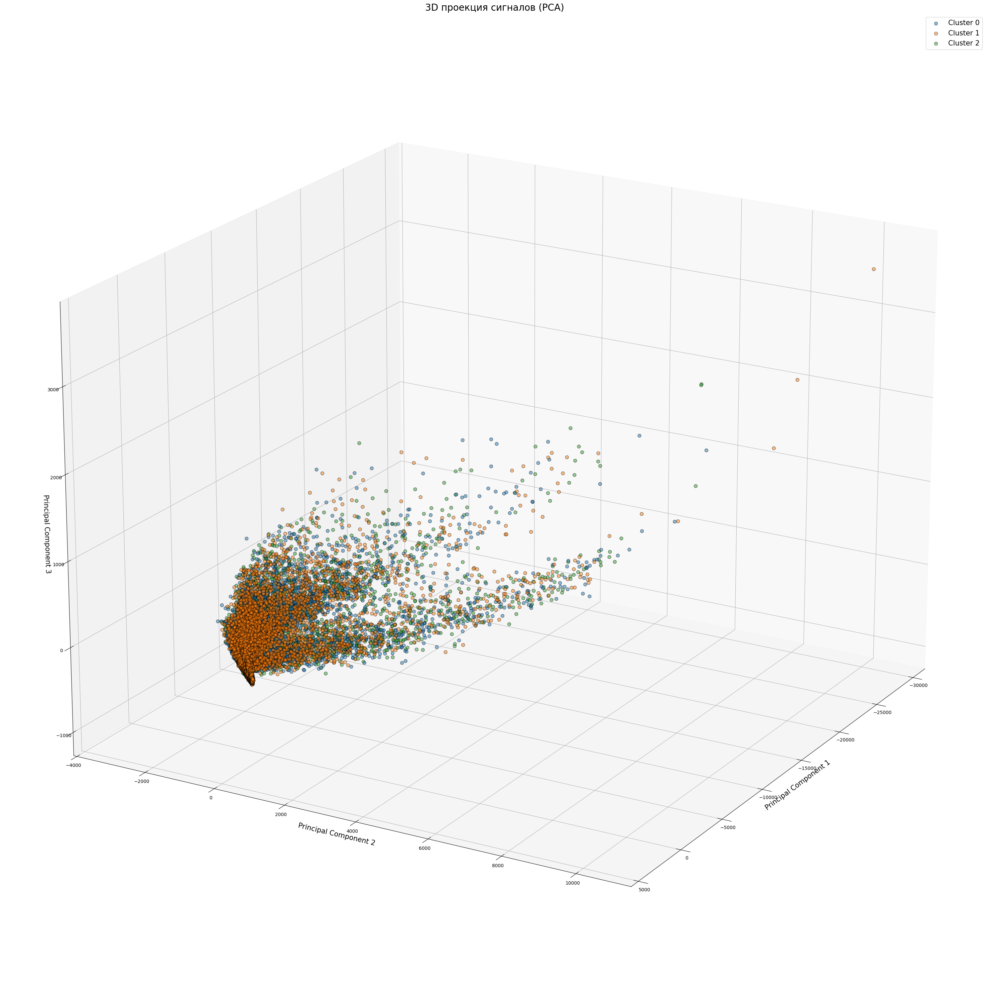

In [18]:
# Создаём заголовок для графика
print('-' * 150)
print('График трёхмерного пространства признаков:')



# Создаём 3D-график
fig = plt.figure(figsize = (30, 30))
ax = fig.add_subplot(111, projection = '3d')



# Разделяем данные по кластерам для цветового отображения
for clusters in [0, 1, 2]:
    
    # Создаём маску для фильтрации данных по кластеру
    mask = cluster_labels == clusters
    
    # Создаём 3D scatter plot для каждого кластера 
    ax.scatter(
        pca_result[mask, 0],
        pca_result[mask, 1],
        pca_result[mask, 2],
        label = f'Cluster {clusters}',
        alpha = 0.5,
        s = 50,
        edgecolor = 'k'
    )
    
    
# Настраиваем оси
ax.set_title('3D проекция сигналов (PCA)', fontsize = 20)
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_zlabel('Principal Component 3', fontsize = 15)
ax.grid(True, linestyle = '--', linewidth = 0.5)
ax.legend(fontsize = 15)
ax.view_init(elev = 20, azim = 30)  
plt.tight_layout()  
plt.show() 

**Вывод:**



#### $3.3$

**Полярная диаграмма.**

Сравним средние значения признаков для каждого кластера, чтобы понять, какие признаки лучше разделяют кластеры:

------------------------------------------------------------------------------------------------------------------------------------------------------
Полярная диаграмма пространства признаков:


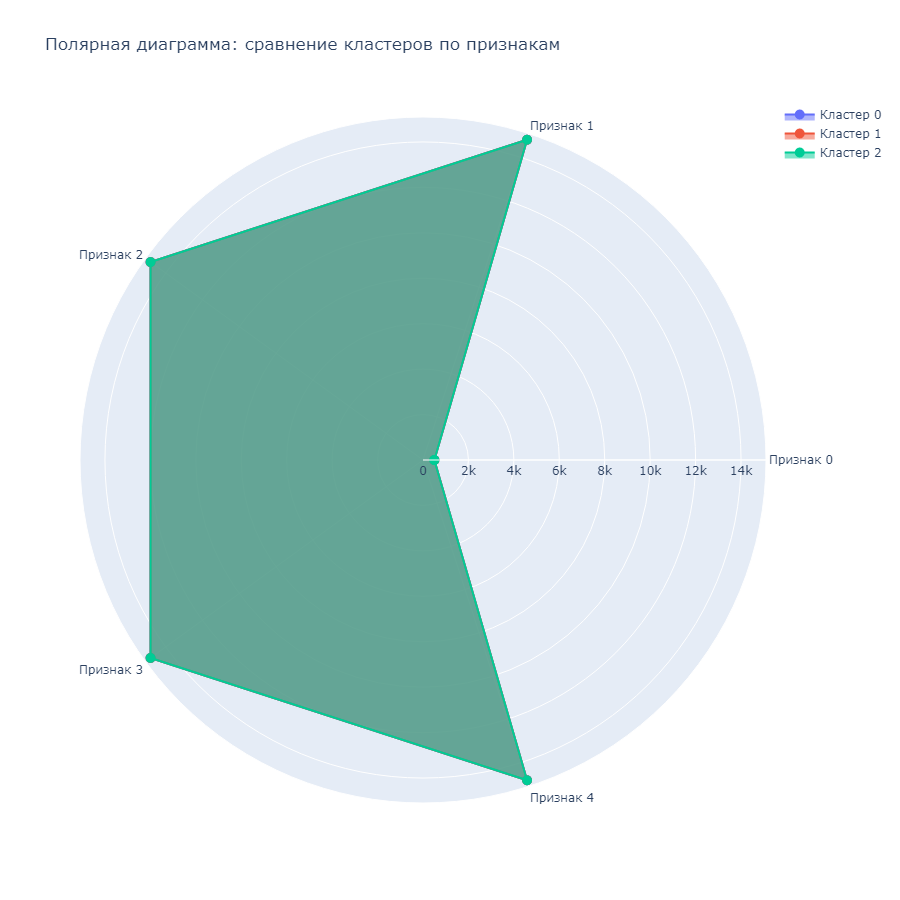

In [103]:
# Создаём заголовок для графика
print('-' * 150)
print('Полярная диаграмма пространства признаков:')



# Возьмём первые 5 признаков и посчитаем средние значения для каждого кластера
selected_features = [0, 1, 2, 3, 4]
cluster_means = SD_df.groupby(cluster_labels)[selected_features].mean()



# Создаём полярную диаграмму
fig = go.Figure()

# Добавляем данные для каждого кластера
for i, clusters in enumerate(cluster_means.index):
    
    # Получаем средние значения для текущего кластера
    values = cluster_means.iloc[i].values.tolist() 
    values += values[:1]  
    
    # Добавляем график
    fig.add_trace( 
        
        go.Scatterpolar(     
            r = values,
            theta = [f'Признак {feat}' for feat in selected_features] + [f'Признак {selected_features[0]}'],
            fill = 'toself',
            name = f'Кластер {clusters}'
        )
    
    )



# Настраиваем внешний вид графика
fig.update_traces(
    mode = 'lines+markers',
    marker = dict(size = 10),
    line = dict(width = 2)
)



# Настраиваем оси и заголовок
fig.update_layout(
    width = 900,
    height = 900,
    
    polar = dict(
        radialaxis = dict(visible = True)
    ),
    
    showlegend = True,
    title = 'Полярная диаграмма: сравнение кластеров по признакам'
)



# Отображаем график
fig.show('png')

**Вывод:**



Теперь создадим функцию для построения нескольких полярных диаграмм с различными признаками:

In [101]:
# Для примера создадим синтетические метки кластеров (0, 1, 2)
np.random.seed(42)
cluster_labels = np.random.choice([0, 1, 2], size = SD_df.shape[0])




# Функция для построения полярных диаграмм
def plot_cluster_profile(data, cluster_labels, feature_ranges, n_clusters = 3):
    
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Полярная диаграмма распределения кластеров по признакам:')
    
    
    # Нормализуем данные в диапазон 0-1
    MM_scaler = preprocessing.MinMaxScaler()
    data_normalized = pd.DataFrame(MM_scaler.fit_transform(data), columns = data.columns)

    # Группируем данные по кластерам и вычисляем средние значения
    grouped_data = data_normalized.groupby(cluster_labels).mean()



    # Для каждого диапазона признаков строим отдельную диаграмму
    for feature_range in feature_ranges:
        start, end = feature_range
        selected_features = data_normalized.columns[start:end]
        selected_data = grouped_data[selected_features]

        # Создаём пустую фигуру
        fig = go.Figure()

        # В цикле визуализируем полярную диаграмму для каждого кластера
        for i in range(n_clusters):
            fig.add_trace(go.Scatterpolar(
                r = selected_data.iloc[i].values,  # Радиусы (значения признаков)
                theta = selected_features,         # Название засечек (признаки)
                fill = 'toself',                   # Заливка многоугольника цветом
                name = f'Кластер {i}'              # Название — номер кластера
            ))

        # Обновляем параметры фигуры
        fig.update_layout(
            showlegend = True,
            autosize = False,
            width = 800,
            height = 800,
            title = f'Полярная диаграмма: сравнение кластеров по признакам {start}–{end-1}'
        )

        # Отображаем фигуру
        fig.show('png')
        print('-' * 105)

Отображаем диаграммы:

------------------------------------------------------------------------------------------------------------------------------------------------------
Полярная диаграмма распределения кластеров по признакам:


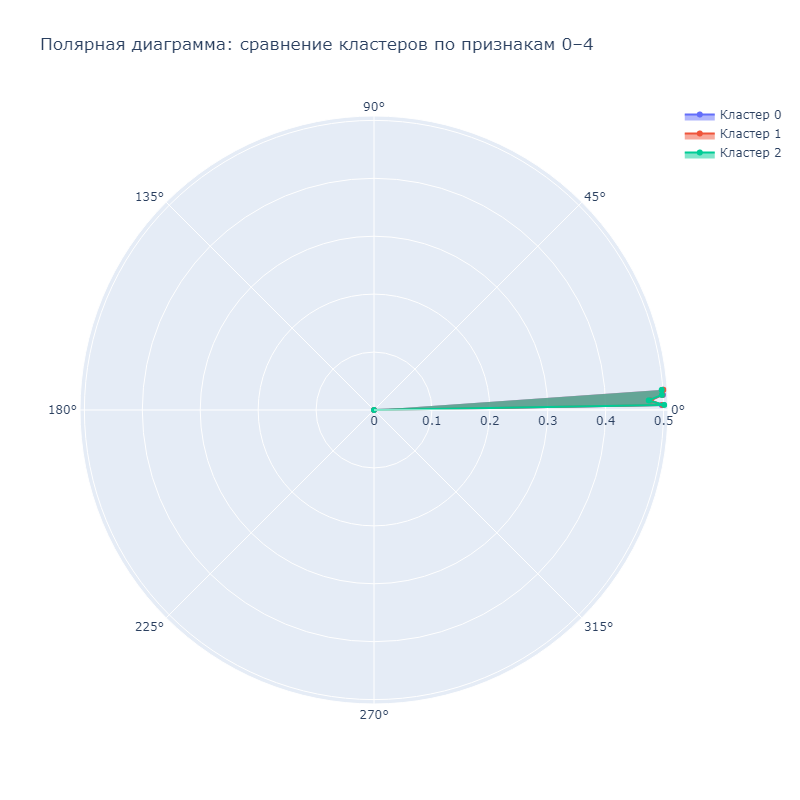

---------------------------------------------------------------------------------------------------------


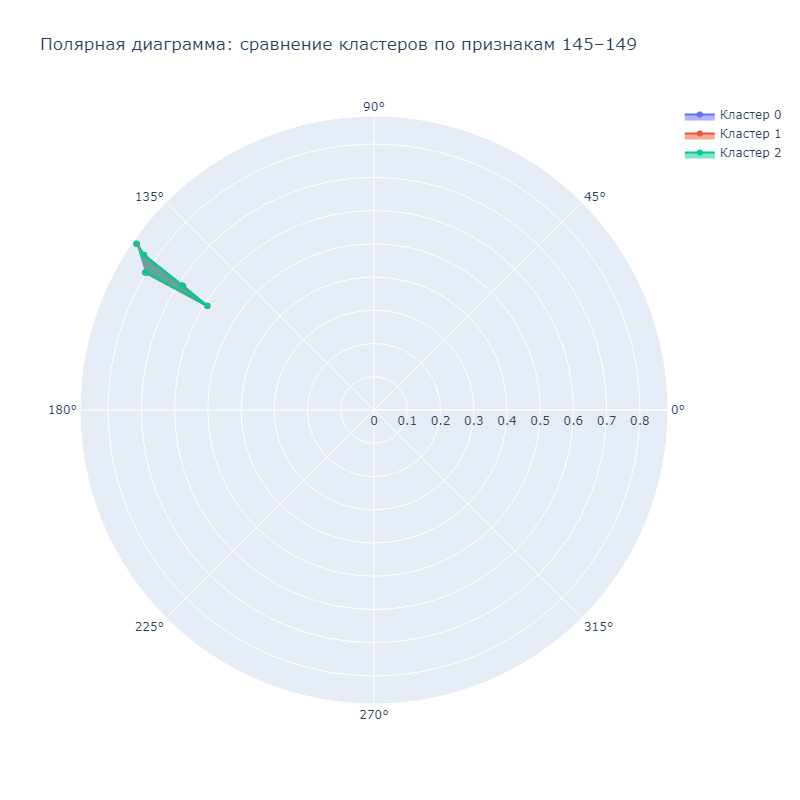

---------------------------------------------------------------------------------------------------------


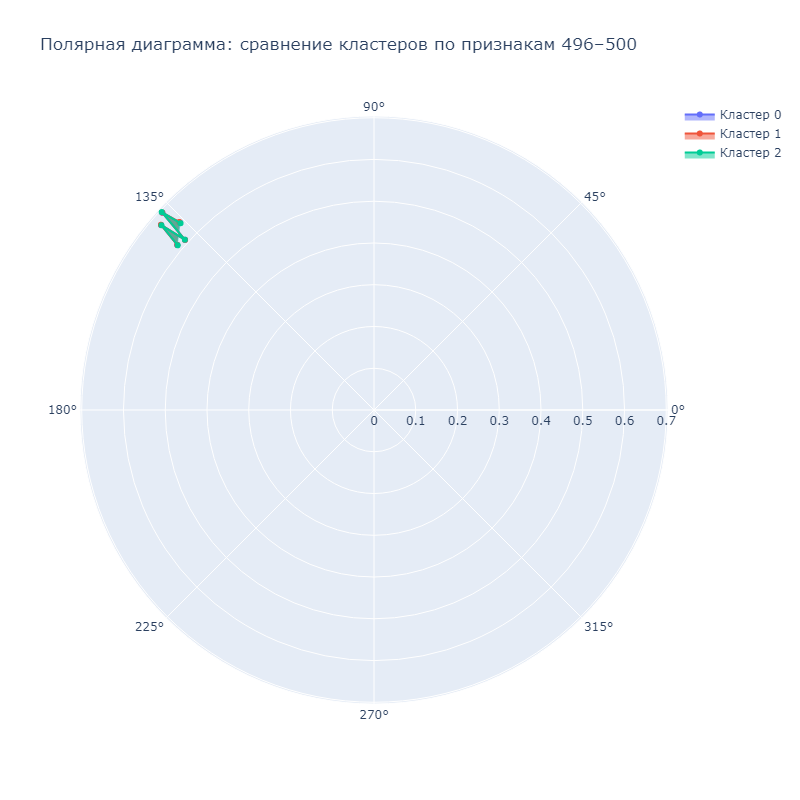

---------------------------------------------------------------------------------------------------------


In [102]:
# Определяем диапазоны признаков для визуализации
feature_ranges = [
    (0, 5),        # Признаки 0–4 (как в твоём примере)
    (145, 150),    # Признаки 145–149 (где много выбросов)
    (496, 501)     # Признаки 496–500 (конец датасета)
]


# Вызываем функцию для построения графиков
plot_cluster_profile(SD_df, cluster_labels, feature_ranges, n_clusters = 3)

**Вывод:**



#### $3.4$

**Парный график для анализа зависимостей.**

Исследуем зависимости между несколькими признаками и посмотрим, как они разделяют кластеры:

------------------------------------------------------------------------------------------------------------------------------------------------------
Парный график для признаков 140–144:


C:\Users\User\AppData\Local\Temp\ipykernel_12156\539447864.py:34: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



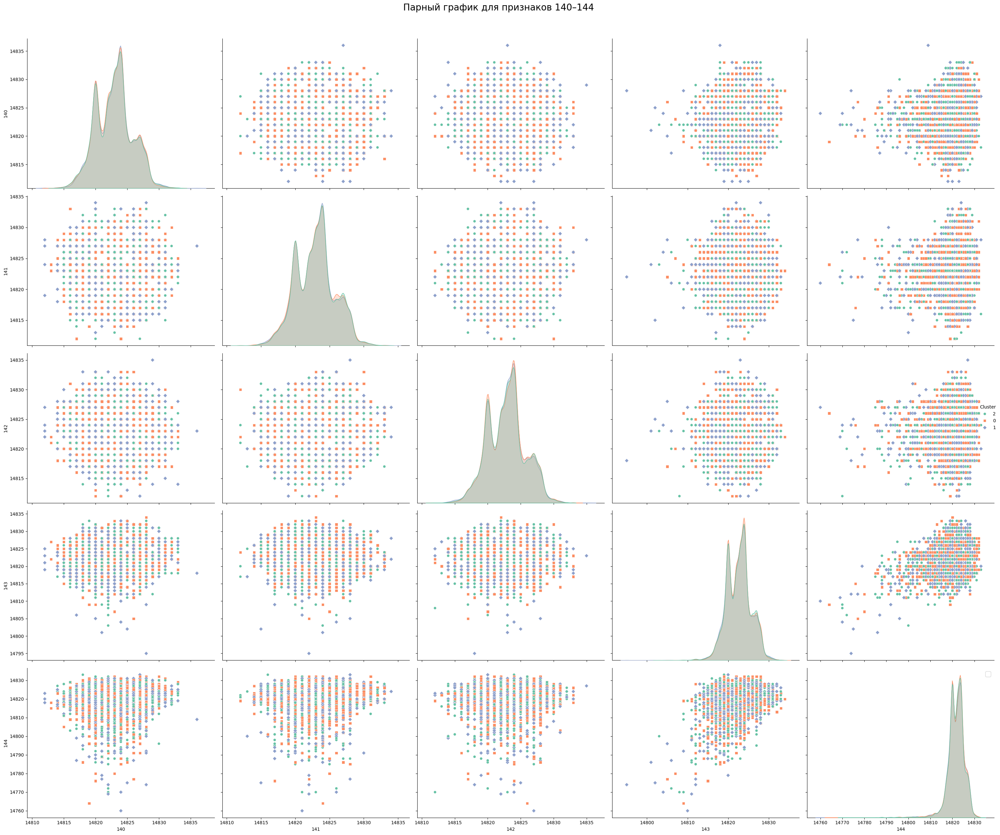

In [62]:
# Выбираем несколько признаков (например, 140–144) и добавляем метки кластеров
selected_features = [140, 141, 142, 143, 144]
df_subset = SD_df.iloc[:, selected_features].copy()
df_subset['Cluster'] = cluster_labels
df_subset['Cluster'] = df_subset['Cluster'].astype(str)  # Преобразуем метки кластеров в строковый тип для удобства отображения



# Создаём заголовок для графика
print('-' * 150)
print('Парный график для признаков 140–144:')

# Зададим размер графика
plt.rcParams['figure.figsize'] = (30, 30)

# Создаём график
sns.pairplot(
    df_subset,
    hue = 'Cluster',
    palette = 'Set2',
    diag_kind = 'kde',
    markers = ['o', 's', 'D'],
    height = 5,
    aspect = 1.2
)

# Задаём стиль графика
plt.suptitle('Парный график для признаков 140–144', fontsize = 20, y = 1.02)
plt.xlabel('Признаки', fontsize = 15)
plt.ylabel('Признаки', fontsize = 15)
plt.xticks(fontsize = 15)                           # размер шрифта для подписей по оси X
plt.yticks(fontsize = 15)                           # размер шрифта для подписей по оси Y
plt.grid(True, linestyle = '--', linewidth = 0.5)
plt.legend(fontsize = 15)                           # размер шрифта для легенды
plt.tight_layout()                                  # автоматическая подгонка графика
plt.show()                                          # вывод графика на экран

**Вывод:**



#### $3.5$

**Временная зависимость с помощью тепловой карты.**

Визуализируем средние значения сигналов во времени для каждого кластера:

------------------------------------------------------------------------------------------------------------------------------------------------------
Тепловая карта для признаков 140–144:


C:\Users\User\AppData\Local\Temp\ipykernel_12156\3687767912.py:34: UserWarning:

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.



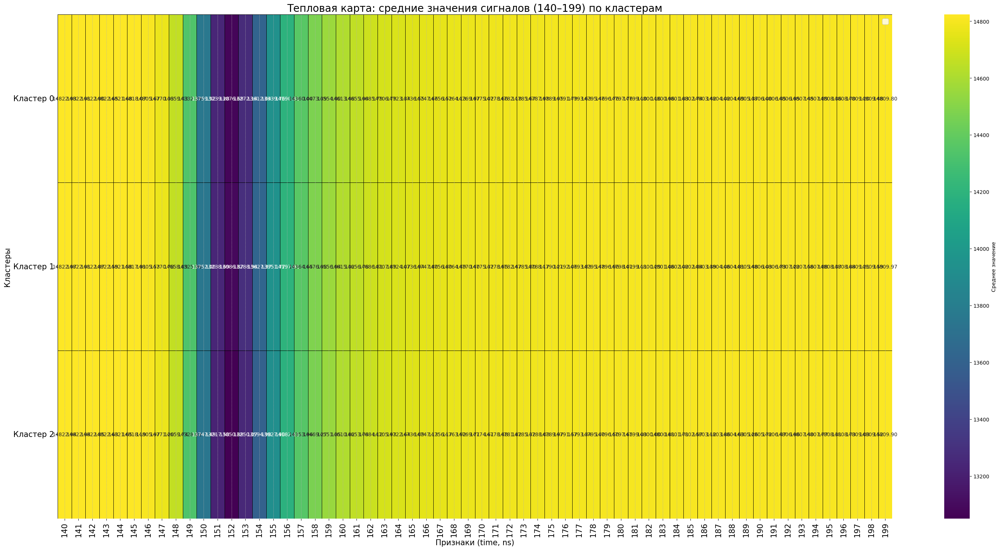

In [ ]:
# Средние значения сигналов в диапазоне 140–199 для каждого кластера
heatmap_data = SD_df.iloc[:, 140:200].groupby(cluster_labels).mean()


# Создаём заголовок для графика
print('-' * 150)
print('Тепловая карта для признаков 140–144:')

# Зададим размер графика
plt.rcParams['figure.figsize'] = (30, 15)

# Создаём график
sns.heatmap(
    heatmap_data,
    cmap = 'viridis',
    annot = True,
    fmt = '.2f',
    linewidths = 0.5,
    linecolor = 'black',
    cbar_kws = {'label': 'Среднее значение'},
    xticklabels = range(140, 200),
    yticklabels = ['Кластер 0', 'Кластер 1', 'Кластер 2']
)

# Задаём стиль графика
plt.title('Тепловая карта: средние значения сигналов (140–199) по кластерам', fontsize = 20)
plt.xlabel('Признаки (time, ns)', fontsize = 15)
plt.ylabel('Кластеры', fontsize = 15)
plt.xticks(fontsize = 15)                           # размер шрифта для подписей по оси X
plt.yticks(fontsize = 15)                           # размер шрифта для подписей по оси Y
plt.xticks(rotation = 90)                           # поворот подписей по оси X
plt.yticks(rotation = 0)                            # поворот подписей по оси Y
plt.grid(True, linestyle = '--', linewidth = 0.5)   # размер сетки
plt.legend(fontsize = 15)                           # размер шрифта для легенды
plt.tight_layout()                                  # автоматическая подгонка графика
plt.show()                                          # вывод графика на экран

**Вывод:**



#### $3.6$

**Анализ аномалий с помощью диаграммы рассеяния с выбросами.**

Визуализируем выбросы в двух признаках, чтобы понять, как они связаны с аномалиями:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для признаков 145, 146:


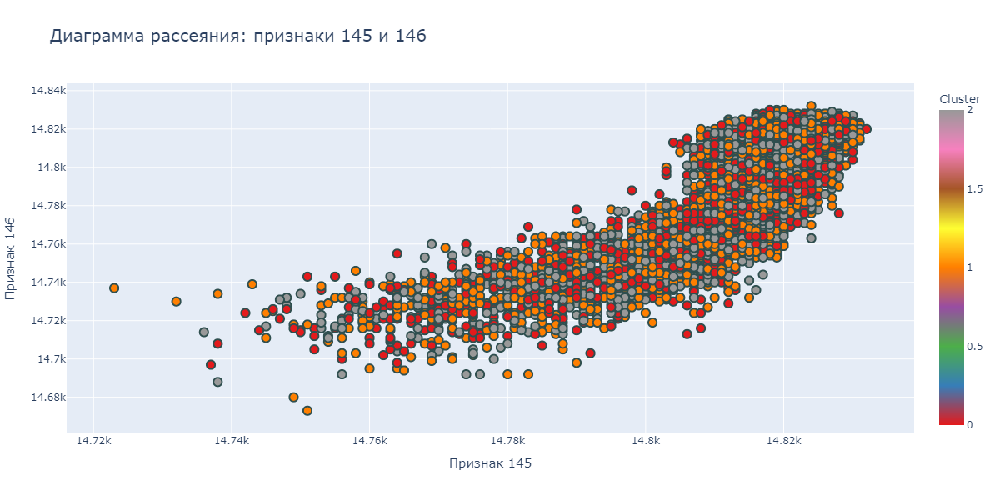

In [37]:
# Выбираем два признака с большим числом выбросов
df_scatter = pd.DataFrame({
    'Feature_145': SD_df.iloc[:, 145],
    'Feature_146': SD_df.iloc[:, 146],
    'Cluster': cluster_labels
})


# Создаём заголовок для графика
print('-' * 150)
print('Диаграмма рассеяния для признаков 145, 146:')


# Зададим размер графика
fig = px.scatter(
    df_scatter, 
    x = 'Feature_145', 
    y = 'Feature_146', 
    color = 'Cluster',
    title = 'Диаграмма рассеяния: признаки 145 и 146',
                 
    labels = {
        'Feature_145': 'Признак 145', 
        'Feature_146': 'Признак 146'
    },
    
    color_continuous_scale = px.colors.qualitative.Set1,
    size_max = 10,
    hover_name = df_scatter.index,
    color_discrete_sequence = px.colors.qualitative.Set1_r
    )


# Настройка осей
fig.update_layout(
    width = 1200,
    height = 600,   
    xaxis_title = 'Признак 145',
    yaxis_title = 'Признак 146', 
    legend_title_text = 'Кластеры'
)


# Настройка осей
fig.update_xaxes(title_font = dict(size = 15))
fig.update_yaxes(title_font = dict(size = 15))

fig.update_layout(
    title_font = dict(size = 20),
    legend_title_font = dict(size = 15),
    legend_font = dict(size = 15)
)



# Настраиваем стиль графика
fig.update_traces(
    marker = dict(
        size = 10, 
        line = dict(width = 2, color = 'DarkSlateGrey')),
        selector = dict(mode = 'markers')
    )



# Отображение графика
fig.show('png')

**Вывод:**



#### $3.7$

Построим график, который показывает, как сигналы распределяются в 2D-пространстве после `t-SNE`:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


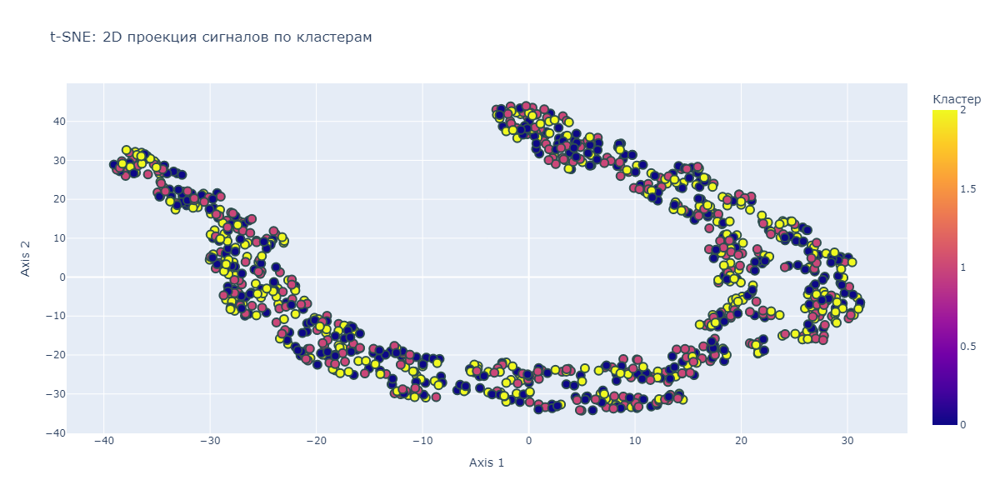

In [80]:
# Используем первые 1000 строк, чтобы ускорить t-SNE
SD_subset = SD_df.iloc[:1000, :]


# Синтетические метки кластеров (замени на реальные, если есть)
np.random.seed(42)
cluster_labels = np.random.choice([0, 1, 2], size = SD_subset.shape[0])


# Снижение размерности с помощью t-SNE
tsne = manifold.TSNE(n_components = 2, random_state = 42)
tsne_result = tsne.fit_transform(SD_subset)


# Создаём DataFrame с результатами t-SNE
tsne_data = pd.DataFrame({
    'axis-1': tsne_result[:, 0],
    'axis-2': tsne_result[:, 1],
    'Cluster': cluster_labels
})



# Создаём заголовок для графика
print('-' * 150)
print('Диаграмма рассеяния для выделения кластеров:')


# Интерактивный scatter plot с Plotly
fig = px.scatter(
    tsne_data,
    x = 'axis-1',
    y = 'axis-2',
    color = 'Cluster',
    color_discrete_sequence = ['dodgerblue', 'red', 'orange'],  
    title = 't-SNE: 2D проекция сигналов по кластерам',
    
    labels = {
        'axis-1': 'Axis 1',
        'axis-2': 'Axis 2',
        'Cluster': 'Кластер'
    },
    
    width = 1200,
    height = 600
)


# Настраиваем оси
fig.update_layout(
    xaxis_title = 'Axis 1',
    yaxis_title = 'Axis 2',
    legend_title_text = 'Clusters'
)


# Настраиваем стиль графика
fig.update_traces(
    marker = dict(
        size = 10, 
        line = dict(width = 2, color = 'DarkSlateGrey')),
        selector = dict(mode = 'markers')
    )


# Отображаем график
fig.show('png')

**Вывод:**

График показывает, что `t-SNE` смог разделить данные на две большие группы, но внутри этих групп кластеры (0, 1, 2) частично перекрываются.
Это может означать, что гамма-кванты, нейтроны и аномалии имеют схожие характеристики в некоторых аспектах, и полное разделение затруднено.

## <CENTER> **`4.` Feature engineering (Создание новых признаков)**

На данном этапе преобразуем некоторые из признаков.

#### $4.1$

**Извлечение статистических признаков.**

Поскольку имеющиеся данные — это временные ряды (сигналы), можно извлечь характеристики каждого сигнала:

* Среднее значение сигнала;
* Стандартное отклонение (дисперсия);
* Максимальная и минимальная амплитуда;
* Медиана;
* Квантили (например, $25$-й и $75$-й процентили):

In [12]:
# Создаём новые признаки
SD_new_df = pd.DataFrame({
    'mean': SD_df.mean(axis = 1),
    'std': SD_df.std(axis = 1),
    'max': SD_df.max(axis = 1),
    'min': SD_df.min(axis = 1),
    'median': SD_df.median(axis = 1),
    'q25': SD_df.quantile(0.25, axis = 1),
    'q75': SD_df.quantile(0.75, axis = 1)
})



# Выводим информацию по DataFrame при помощи функции 'check_data_inf'
check_data_inf(
    data = SD_new_df,
    length1 = 40,
    length2 = 70
)

Данные имеют следующую размерность:

Количество строк: 23479;
Количество признаков (столбцов): 7.
----------------------------------------


,mean,std,max,min,median,q25,q75
0,14783.335329,641.072807,14830,500,14820.0,14817.0,14822.0
1,14769.235529,659.273142,14828,500,14820.0,14818.0,14823.0
2,14759.491018,676.882175,14830,500,14820.0,14818.0,14822.0
3,14784.874251,641.434753,14831,500,14821.0,14819.0,14824.0
4,14769.678643,657.662076,14828,500,14820.0,14818.0,14823.0


----------------------------------------------------------------------


#### $4.2$

**Характеристики формы сигнала.**

Для сигналов, таких как гамма-кванты и нейтроны, рассчитаем следующие характеристики:

* Время нарастания;
* Длительность пика;
* Асимметрия сигнала:

In [13]:
# Рассчёт времени нарастания (индекс максимума)
rise_time = SD_df.idxmax(axis = 1)


# Рассчёт длительности пика 
def peak_duration(row):
    
    threshold = 0.5 * row.max()
    above_threshold = row > threshold
    
    return above_threshold.sum()


# Создаём признаки
SD_new_df['rise_time'] = rise_time
SD_new_df['peak_duration'] = SD_df.apply(peak_duration, axis = 1)
SD_new_df['skewness'] = SD_df.apply(stats.skew, axis = 1)




# Выводим информацию по DataFrame при помощи функции 'check_data_inf'
check_data_inf(
    data = SD_new_df,
    length1 = 40,
    length2 = 100
)

Данные имеют следующую размерность:

Количество строк: 23479;
Количество признаков (столбцов): 10.
----------------------------------------


,mean,std,max,min,median,q25,q75,rise_time,peak_duration,skewness
0,14783.335329,641.072807,14830,500,14820.0,14817.0,14822.0,26,500,-22.144991
1,14769.235529,659.273142,14828,500,14820.0,14818.0,14823.0,27,500,-20.426207
2,14759.491018,676.882175,14830,500,14820.0,14818.0,14822.0,339,500,-19.029677
3,14784.874251,641.434753,14831,500,14821.0,14819.0,14824.0,321,500,-22.115491
4,14769.678643,657.662076,14828,500,14820.0,14818.0,14823.0,37,500,-20.562063


----------------------------------------------------------------------------------------------------


#### $4.3$

**Частотные характеристики.**

Применим преобразование Фурье для извлечения частотных характеристик:

* Амплитуды на определённых частотах;
* Доминирующая частота:

In [14]:
# Функция для извлечения частотных характеристик
def extract_fft_features(row):
    
    fft_values = fft.fft(row.values)
    fft_amplitudes = np.abs(fft_values)[:10]    # берём первые 10 частот
    
    return fft_amplitudes



# Применяем FFT к каждому сигналу
fft_features = SD_df.apply(
    extract_fft_features, 
    result_type = 'expand',
    axis = 1
)

fft_features.columns = [f'fft_{i}' for i in range(10)]


# Добавляем к новым признакам
SD_new_df = pd.concat([SD_new_df, fft_features], axis = 1)



# Выводим информацию по DataFrame при помощи функции 'check_data_inf'
check_data_inf(
    data = SD_new_df,
    length1 = 40,
    length2 = 150
)

Данные имеют следующую размерность:

Количество строк: 23479;
Количество признаков (столбцов): 20.
----------------------------------------


,mean,std,max,min,median,q25,q75,rise_time,peak_duration,skewness,fft_0,fft_1,fft_2,fft_3,fft_4,fft_5,fft_6,fft_7,fft_8,fft_9
0,14783.335329,641.072807,14830,500,14820.0,14817.0,14822.0,26,500,-22.144991,7406451.0,12967.061665,12111.200327,17557.113642,15075.516477,11279.265510,16131.195749,16458.877047,11608.314856,14384.451090
1,14769.235529,659.273142,14828,500,14820.0,14818.0,14823.0,27,500,-20.426207,7399387.0,14682.296039,9734.564611,24837.929770,19298.647854,4225.694001,21956.979211,22412.938271,5651.740574,17583.280656
2,14759.491018,676.882175,14830,500,14820.0,14818.0,14822.0,339,500,-19.029677,7394505.0,17150.814405,11004.428145,29132.312961,22591.571088,3132.624140,25712.732865,26183.305387,4782.365382,20121.812373
3,14784.874251,641.434753,14831,500,14821.0,14819.0,14824.0,321,500,-22.115491,7407222.0,13052.637345,11952.496075,17746.413329,15194.600881,10953.333692,16404.889415,16611.106189,11344.968997,14571.743893
4,14769.678643,657.662076,14828,500,14820.0,14818.0,14823.0,37,500,-20.562063,7399609.0,14620.928771,9581.652266,24471.975781,19024.361221,4472.802782,21573.748134,22300.458427,5894.313454,17161.218033


------------------------------------------------------------------------------------------------------------------------------------------------------


## <CENTER> **`5.` Отбор признаков**

На данном этапе проведём корреляционный анализмежду признаками, по необходимости избавимся от мультиколлинеарности, проведём нормализацию и отберём только самые информативные признаки для дальнейшего исследования.

#### $5.1$

**Отбор самых информативных признаков.**

Для начала удалим признаки с низкой дисперсией:

In [15]:
# Инициализируем VarianceThreshold
VT_selector = feature_selection.VarianceThreshold(threshold = 0.01)

# Применяем к SD_new_df
SD_df_reduced = VT_selector.fit_transform(SD_new_df)

# Преобразуем результат в DataFrame
# Получаем имена оставшихся признаков после VarianceThreshold
selected_features = SD_new_df.columns[VT_selector.get_support()]
SD_df_reduced = pd.DataFrame(SD_df_reduced, columns = selected_features)


# Выведем информацию получившегося DataFrame с помощью функции 'check_data_inf'
check_data_inf(
    data = SD_df_reduced,
    length1 = 40,
    length2 = 150
)

Данные имеют следующую размерность:

Количество строк: 23479;
Количество признаков (столбцов): 20.
----------------------------------------


,mean,std,max,min,median,q25,q75,rise_time,peak_duration,skewness,fft_0,fft_1,fft_2,fft_3,fft_4,fft_5,fft_6,fft_7,fft_8,fft_9
0,14783.335329,641.072807,14830.0,500.0,14820.0,14817.0,14822.0,26.0,500.0,-22.144991,7406451.0,12967.061665,12111.200327,17557.113642,15075.516477,11279.265510,16131.195749,16458.877047,11608.314856,14384.451090
1,14769.235529,659.273142,14828.0,500.0,14820.0,14818.0,14823.0,27.0,500.0,-20.426207,7399387.0,14682.296039,9734.564611,24837.929770,19298.647854,4225.694001,21956.979211,22412.938271,5651.740574,17583.280656
2,14759.491018,676.882175,14830.0,500.0,14820.0,14818.0,14822.0,339.0,500.0,-19.029677,7394505.0,17150.814405,11004.428145,29132.312961,22591.571088,3132.624140,25712.732865,26183.305387,4782.365382,20121.812373
3,14784.874251,641.434753,14831.0,500.0,14821.0,14819.0,14824.0,321.0,500.0,-22.115491,7407222.0,13052.637345,11952.496075,17746.413329,15194.600881,10953.333692,16404.889415,16611.106189,11344.968997,14571.743893
4,14769.678643,657.662076,14828.0,500.0,14820.0,14818.0,14823.0,37.0,500.0,-20.562063,7399609.0,14620.928771,9581.652266,24471.975781,19024.361221,4472.802782,21573.748134,22300.458427,5894.313454,17161.218033


------------------------------------------------------------------------------------------------------------------------------------------------------


#### $5.2$

Теперь проведём корреляционный анализ. Построим тепловую карту корреляций признаков:

In [16]:
# Создаём функцию 'heatmap_corr()' для построения тепловой карты корреляции
def heatmap_corr(data, title = 'Correlation Heatmap', figsize = (30, 30)):
    
    
    """
    Функция для построения тепловой карты корреляции.
    
    Параметры:
    data (DataFrame): Данные для анализа.
    title (str): Заголовок графика.
    figsize (tuple): Размер графика.
    
    """
    
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Тепловая карта корреляции признаков:')
    
    
    # Задаём размер полотна
    plt.rcParams['figure.figsize'] = figsize
    
    # Строим тепловую карту
    sns.heatmap(
        data.corr(),
        annot = True,
        fmt = '.2f',
        cmap = 'coolwarm',
        vmin = -1, 
        vmax = 1, 
        center = 0,
        square = True,
        cbar_kws = {'shrink': .8},
        linewidths = 0.5
    )
    
    # Настраиваем параметры
    plt.title(title, fontsize = 20)
    plt.tight_layout()
    
    # Выводим график
    plt.show()

Строим тепловую карту:

------------------------------------------------------------------------------------------------------------------------------------------------------
Тепловая карта корреляции признаков:


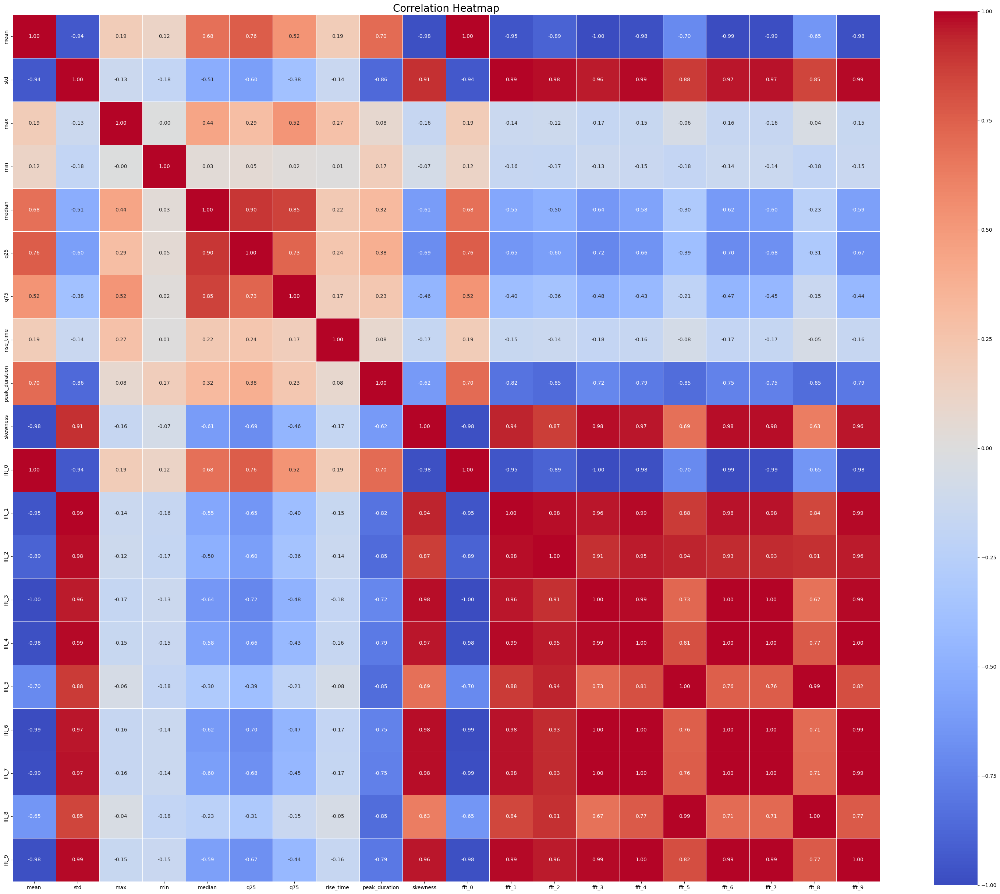

In [17]:
# Применяем функцию 'heatmap_corr()' для построения тепловой карты корреляции
heatmap_corr(SD_df_reduced)

Удалим высококоррелированные признаки:

In [18]:
# Вычисляем корреляционную матрицу
corr_matrix = SD_df_reduced.corr().abs()

# Создаём маску для верхнего треугольника
upper_features = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k = 1).astype(bool))

# Находим признаки с корреляцией выше 0.9
features_to_drop = [column for column in upper_features.columns if any(upper_features[column] > 0.9)]

# Удаляем коррелированные признаки
SD_df_cleaned = SD_df_reduced.drop(columns = features_to_drop)



# Выведем информацию получившегося DataFrame с помощью функции 'check_data_inf'
check_data_inf(
    data = SD_df_cleaned,
    length1 = 40,
    length2 = 85
)

Данные имеют следующую размерность:

Количество строк: 23479;
Количество признаков (столбцов): 8.
----------------------------------------


,mean,max,min,median,q25,q75,rise_time,peak_duration
0,14783.335329,14830.0,500.0,14820.0,14817.0,14822.0,26.0,500.0
1,14769.235529,14828.0,500.0,14820.0,14818.0,14823.0,27.0,500.0
2,14759.491018,14830.0,500.0,14820.0,14818.0,14822.0,339.0,500.0
3,14784.874251,14831.0,500.0,14821.0,14819.0,14824.0,321.0,500.0
4,14769.678643,14828.0,500.0,14820.0,14818.0,14823.0,37.0,500.0


-------------------------------------------------------------------------------------


Повторно выведем тепловую карту очищенного DaraFrame:

------------------------------------------------------------------------------------------------------------------------------------------------------
Тепловая карта корреляции признаков:


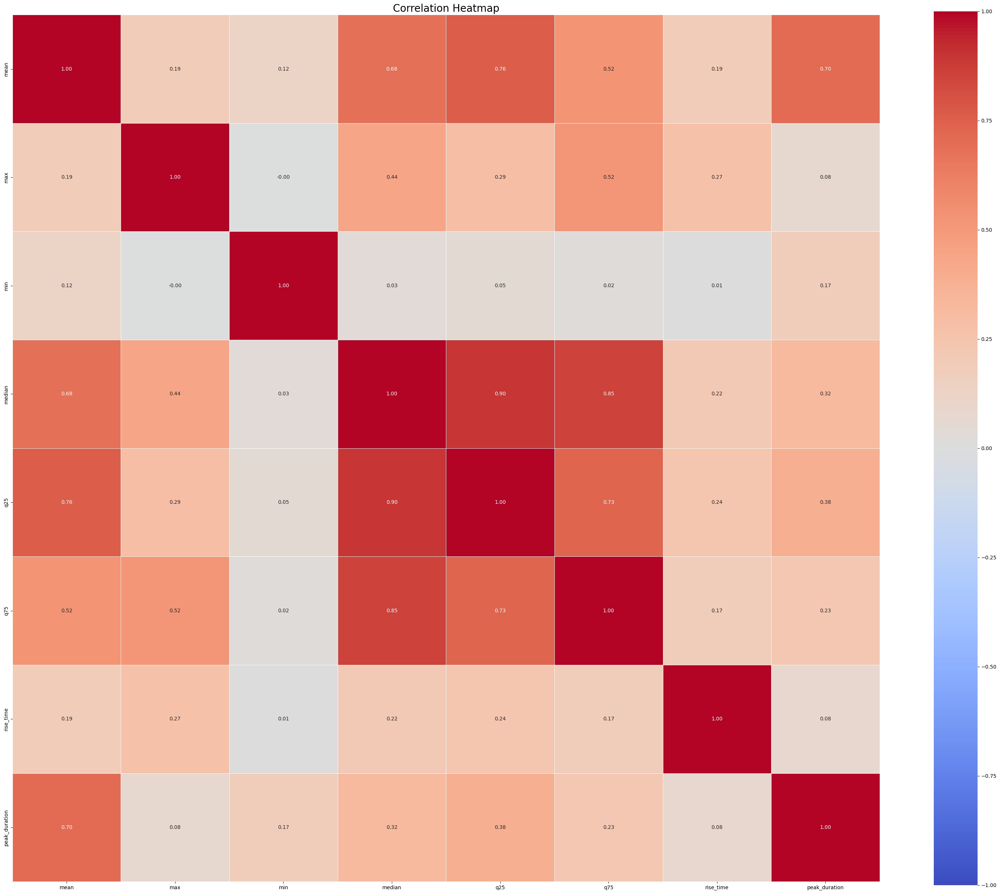

In [19]:
# Применяем функцию 'heatmap_corr()' для построения тепловой карты корреляции
heatmap_corr(data = SD_df_cleaned)

**Вывод:**



#### $5.3$

**Стандартизауия признаков.**

Создаём функцию для построения графика распределения признаков:

In [20]:
# Создаём функцию 'features_distribution_plot()' для построения графика распределения признаков
def features_distribution_plot(data, title = 'Распределение до нормализации', figsize = (30, 17)):
    
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('График распределения признаков:')
    
    
    """
    Функция для построения графиков распределения признаков.
    
    Параметры:
    - data: pandas DataFrame с данными.
    - features: список признаков для анализа.
    - title: заголовок графика.
    - figsize: размер графика.
    
    """
    
    
    # Задаём размер графика
    fig, ax = plt.subplots(figsize = figsize)

    # Построение плотностей распределения
    for column in data.columns:
    
        sns.kdeplot(
            data[column], 
            label = column, 
            ax = ax
        )



    # Настройка легенды: выносим за пределы графика
    plt.legend(
        bbox_to_anchor = (1.05, 1),
        loc = 'upper left',
        fontsize = 10
    )

    # Настройка графика
    plt.title(title, fontsize = 20)
    plt.xlabel('Значение', fontsize = 15)
    plt.ylabel('Плотность', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()  
    plt.show()

Построим график распределения признаков:

------------------------------------------------------------------------------------------------------------------------------------------------------
График распределения признаков:


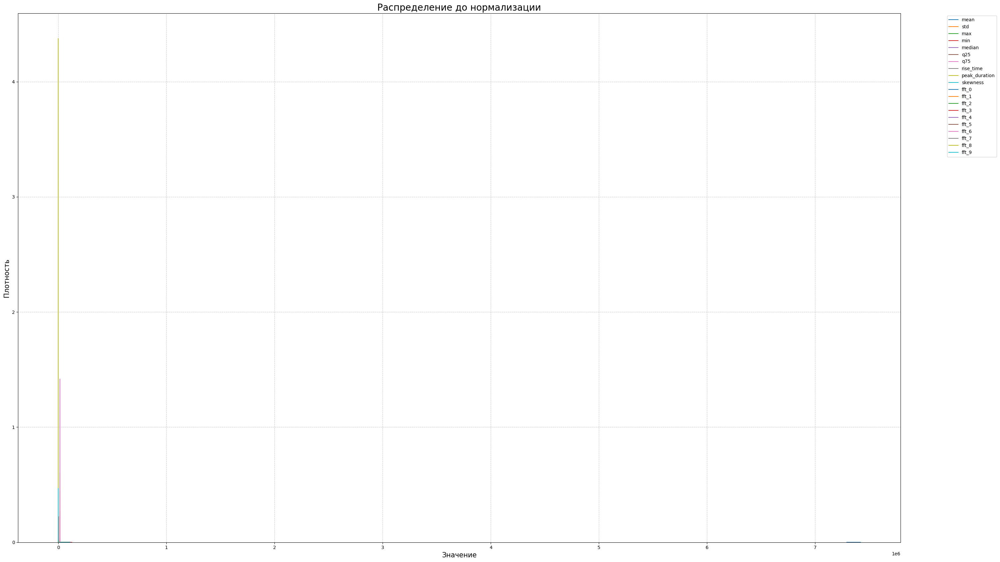

In [21]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков
features_distribution_plot(data = SD_df_reduced)

**Вывод:**

Большинство значений признаков сосредоточены около $0$ (сильный пик в начале), так же присутствует длинный "хвост" с редкими значениями, доходящими до $7$, что делает данное распределение сильно скошенным вправо.


Воспользуемся методом главных компонент (`PCA`). Для его стабильной работы данные необходимо стандартизировать/нормализовать. Для удобства обернём эти шаги по предобработке данных в *pipeline*.

Создадим *pipeline*, в котором будут следующие шаги:

* стандартизация с помощью `StandardScaler` с параметрами по умолчанию;
* метод главных компонент с двумя компонентами.

Обучим *pipeline* на таблице `SD_df_reduced`:

In [22]:
# Инициализируем StandardScaler
STD_scaler = preprocessing.StandardScaler()

# Oпределяем метод главных компонент с двумя компонентами
pca = decomposition.PCA(n_components = 2)


# Задаём объект класса pipeline
pipeline_pca = pipeline.Pipeline([
    ('scaler', STD_scaler),
    ('PCA', pca)
])


# Обучаем pipeline и применяем трансформацию к таблице
SD_df_pca = pipeline_pca.fit_transform(SD_df_reduced)

# Выводим долю дисперсии исходных данных, котораую объясняет первая главная компонента
print('Доля диспресии главной компоненты: {:.2f}'.format(pipeline_pca['PCA'].explained_variance_ratio_[0]))


# Создаём DataFrame из полученной таблицы
SD_df_pca = pd.DataFrame(
    data = SD_df_pca,
    columns = ['axis-1', 'axis-2'],
    index = SD_df_reduced.index
)

Доля диспресии главной компоненты: 0.69


Выведем информацию по данным:

In [23]:
# Выведем информацию получившегося DataFrame с помощью функции 'check_data_inf'
check_data_inf(
    data = SD_df_pca,
    length1 = 40,
    length2 = 30
)

Данные имеют следующую размерность:

Количество строк: 23479;
Количество признаков (столбцов): 2.
----------------------------------------


,axis-1,axis-2
0,-1.091072,-1.661095
1,-0.593523,-2.180486
2,0.092315,-1.744578
3,-1.685552,0.233156
4,-0.644727,-2.154296


------------------------------


Повторно строим график распределения после стандартизации:

------------------------------------------------------------------------------------------------------------------------------------------------------
График распределения признаков:


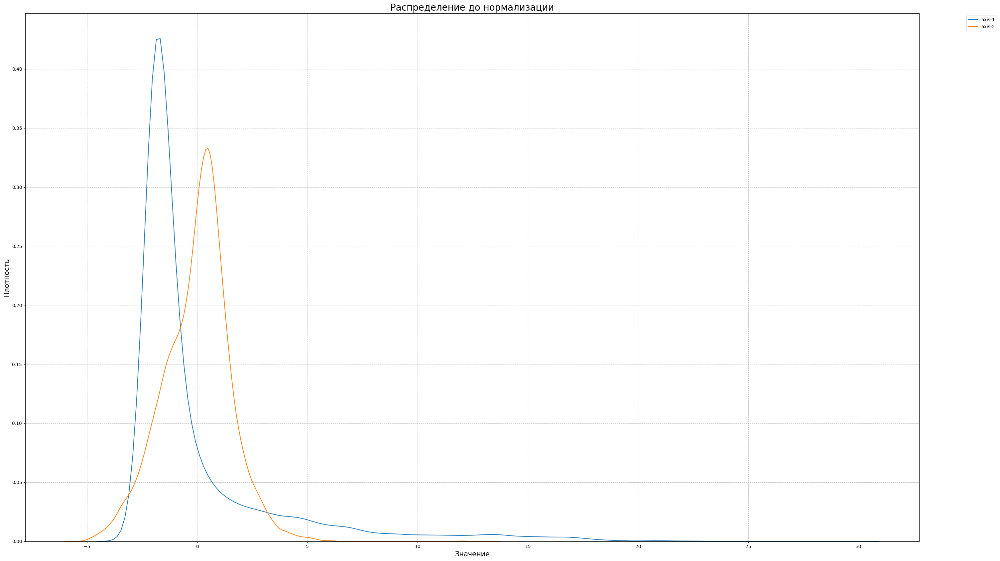

In [24]:
# Применяем функцию 'features_distribution_plot()' для построения графика распределения признаков
features_distribution_plot(data = SD_df_pca)

**Вывод:**



## <CENTER> **`6.` Machine Learning (clustering)**

На данном этапе мы построим несколько подходящих моделей для кластеризации и выявим наилучшую.

Для начала создадим функции для визуализации распределений:

**Функция для визуализации разделения кластеров (matplotlib):**

In [25]:
# Создаём функцию 'clusters_visualization_matplotlib'          
def clusters_visualization_matplotlib(data, hue = None, palette = None):
    
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Диаграмма рассеяния для выделения кластеров:')



    # Зададим размер графика
    plt.rcParams['figure.figsize'] = (30, 15)

    # Создаём график
    sns.scatterplot(
        data = data,
        x = 'axis-1',
        y = 'axis-2',
        palette = palette,
        hue = hue,
        alpha = 0.5,
        s = 10
    )


    # Задаём стиль графика
    plt.title('Пространство главных компонент PCA после декомпозиции', fontsize = 20)
    plt.xlabel('Первая главная компонента', fontsize = 15)
    plt.ylabel('Вторая главная компонента', fontsize = 15)
    plt.grid(axis = 'y', alpha = 0.75)
    plt.xticks(fontsize = 15)
    plt.yticks(fontsize = 15)
    plt.grid(True, linestyle = '--', linewidth = 0.5)
    plt.tight_layout()
    plt.show()

**Функция для визуализации разделения кластеров (plotly):**

In [26]:
# Создаём функцию 'clusters_visualization_px'
def clusters_visualization_px(data, labels = None, title = None):
    
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Диаграмма рассеяния для выделения кластеров:')



    # Создаём DataFrame для визуализации
    pca_df_sample = data.iloc[:, :2].copy()
    pca_df_sample.columns = ['PC1', 'PC2']
    pca_df_sample['Cluster'] = labels
    pca_df_sample['Cluster'] = pca_df_sample['Cluster'].astype(str)


    # Создаём scatterplot
    fig = px.scatter(
        pca_df_sample,
        x = 'PC1',
        y = 'PC2',
        color = 'Cluster',
        title = title,
    
        labels = {
            'PC1': 'Главная компонента 1',
            'PC2': 'Главная компонента 2'
        },
    
        opacity = 0.6,
        size_max = 10
    )


    # Настройка оформления
    fig.update_layout(
        width = 1200,
        height = 600,
        title_font_size = 15,
        xaxis_title_font_size = 12,
        yaxis_title_font_size = 12,
        legend_title_text = 'Кластер',
        showlegend = True
    )


    # Настраиваем стиль графика
    fig.update_traces(
        marker = dict(
            size = 10, 
            line = dict(width = 2, color = 'DarkSlateGrey')),
            selector = dict(mode = 'markers')
        )


    # Отображаем график
    fig.show('png')

**Функция для визуализации разделения кластеров (go):**

In [27]:
# Создаём функцию 'clusters_visualization_go'
def clusters_visualization_go(data, labels = None, title = None):
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Диаграмма рассеяния для выделения кластеров:')



    # Создаём DataFrame для визуализации
    pca_df_sample = data.iloc[:, :2].copy()  
    pca_df_sample.columns = ['PC1', 'PC2']  
    pca_df_sample['Cluster'] = labels
    pca_df_sample['Cluster'] = pca_df_sample['Cluster'].astype(str)  



    # Разделяем точки по кластерам
    traces = []
    unique_clusters = sorted(pca_df_sample['Cluster'].unique())

    for cluster in unique_clusters:
        cluster_df = pca_df_sample[pca_df_sample['Cluster'] == cluster]
        trace = go.Scatter(
            x = cluster_df['PC1'],
            y = cluster_df['PC2'],
            mode = 'markers',
            name = f'Кластер {cluster}',
        
            marker = dict(
                size = 8,
                opacity = 0.6
            ),
        
            text = [f'Кластер: {cluster}' for _ in range(len(cluster_df))],
            hoverinfo = 'text+x+y'
        )
    
        # Добавляем точки кластера в список traces
        traces.append(trace)




    # Создаём фигуру
    fig = go.Figure(data = traces)


    # Настройка оформления графика
    fig.update_layout(
        title = title,
        xaxis_title = 'Главная компонента 1',
        yaxis_title = 'Главная компонента 2',
        width = 1200,
        height = 600,
        title_font_size = 15,
        xaxis_title_font_size = 12,
        yaxis_title_font_size = 12,
        legend_title_text = 'Кластер',
        showlegend = True,
        template = 'plotly_white'
    )


    # Настраиваем стиль графика
    fig.update_traces(
        marker = dict(
            size = 10, 
            line = dict(width = 2, color = 'DarkSlateGrey')),
            selector = dict(mode = 'markers')
        )


    # Отображаем график
    fig.show('png')

**Функция для построения столбчатой диаграммы распределения кластеров (plotly):**

In [28]:
# Создаём функцию 'clusters_visualization_hist_px'
def clusters_visualization_hist_px(data, labels = None, title = None):
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Столбчатая гистограмма распределения кластеров:')
    
    
    
    # Создаём DataFrame для визуализации
    pca_df_sample = data.iloc[:, :2].copy()
    pca_df_sample.columns = ['PC1', 'PC2']
    pca_df_sample['Cluster'] = labels
    pca_df_sample['Cluster'] = pca_df_sample['Cluster'].astype(str)



    # Построение гистограммы распределения кластеров
    fig = px.histogram(
        pca_df_sample,
        x = 'Cluster',
        title = title,
    
        labels = {
            'Cluster': 'Кластер',
            'count': 'Количество точек'
        },
    
        color = 'Cluster',
        opacity = 0.8
    )


    # Настройка оформления
    fig.update_layout(
        width = 1200,
        height = 600,
        title_font_size = 15,
        xaxis_title_font_size = 12,
        yaxis_title_font_size = 12,
        showlegend = True
    )


    # Настраиваем стиль графика
    fig.update_traces(
        marker = dict(
            size = 10, 
            line = dict(width = 2, color = 'DarkSlateGrey')),
            selector = dict(mode = 'markers')
        )


    # Выводим график
    fig.show('png')

**Функция для построения полярной диаграммы (go):**

In [29]:
# Создаём функцию 'plot_cluster_profile'
def plot_cluster_profile(data, n_clusters):
    
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Полярная диаграмма распределения кластеров:')
    
    
    # Нормализуем сгруппированные данные, приводя их к масштабу 0-1.
    MM_scaler = preprocessing.MinMaxScaler()
    data = pd.DataFrame(MM_scaler.fit_transform(data), columns = data.columns)
    
    # Создаём список признаков
    features_list = data.columns
    
    # Создаём пустую фигуру
    fig = go.Figure()
    
    
    
    # В цикле визуализируем полярную диаграмму для каждого кластера
    for i in range(n_clusters):
        
        # Создаём полярную диаграмму и добавляем её на общий график
        fig.add_trace(go.Scatterpolar(
            r = data.iloc[i].values,  # радиусы
            theta = features_list,    # название засечек
            fill = 'toself',          # заливка многоугольника цветом
            name = f'Cluster {i}'     # название — номер кластера
        ))
        
        
        # Обновляем параметры фигуры
        fig.update_layout(
            showlegend = True,  # отображение легенды
            autosize = False,   # устанавливаем свои размеры графика
            width = 800,        # ширина (в пикселях)
            height = 800,        # высота (в пикселях)
            title = f'Полярная диаграмма: сравнение кластеров по признакам'
        )
        
        
        
        # Отображаем фигуру
        fig.show('png')   
        print('-' * 105)

#### $6.1$

#### **K-Means**

Визуализируем пространство главных компонент после декомпозиции:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


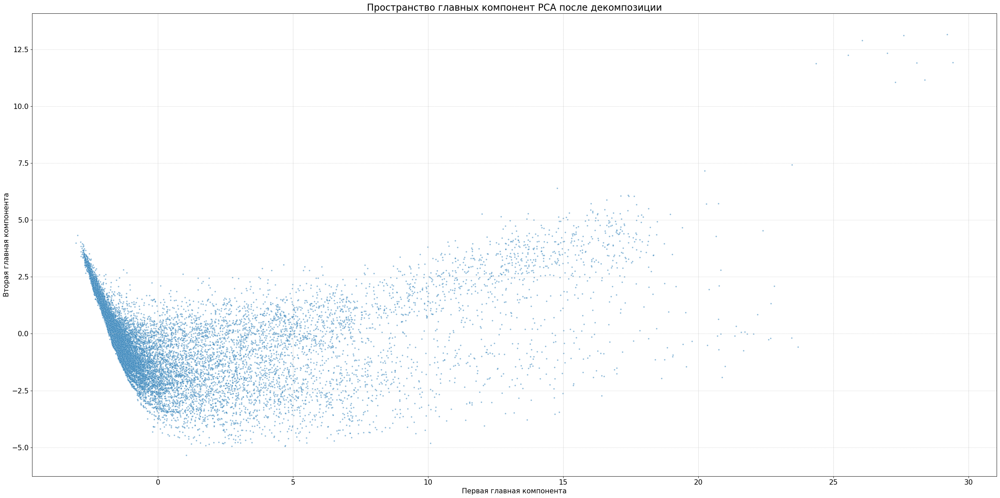

In [30]:
# Строим визуализацию
clusters_visualization_matplotlib(data = SD_df_pca)

Попробуем разделить это пространство главных компонент на сегменты.

Воспользуемся методом `k-means`.

Подберём оптимальное количество кластеров для метода `k-means` с помощью коэффициента силуэта, перебирая возможные значения от $2$ до $10$ включительно. В качестве значения параметра *random_state* возьмём число $42$. Остальные параметры оставим по умолчанию:

In [31]:
# Создаём список для значений количества кластеров
labels_list = []
K_values = range(2, 11)



# Проходимся циклом по всем нужным нам значениям количества кластеров
for silhouette in K_values:
    
    # Создаём объект класса KMeans
    KM_model = cluster.KMeans(
        n_clusters = silhouette,
        random_state = 42
    )
    
    # Oбучаем модель k-means с текущим количеством кластеров
    KM_model.fit(SD_df_pca)
    
    # Предсказываем метки
    KM_predict = KM_model.labels_
    
    # Добавляем значения в список
    labels_list.append(KM_model.labels_)
    
    # Выводим результат для коэффициента силуэта
    print('Результат коэффициента силуэта {}: {:.2f}'.format(silhouette, metrics.silhouette_score(SD_df_pca, KM_predict)))
    print('-' * 40)

Результат коэффициента силуэта 2: 0.74
----------------------------------------
Результат коэффициента силуэта 3: 0.64
----------------------------------------
Результат коэффициента силуэта 4: 0.52
----------------------------------------
Результат коэффициента силуэта 5: 0.50
----------------------------------------
Результат коэффициента силуэта 6: 0.42
----------------------------------------
Результат коэффициента силуэта 7: 0.42
----------------------------------------
Результат коэффициента силуэта 8: 0.43
----------------------------------------
Результат коэффициента силуэта 9: 0.44
----------------------------------------
Результат коэффициента силуэта 10: 0.45
----------------------------------------


Строим визуализацию:

------------------------------------------------------------------------------------------------------------------------------------------------------
График метода локтя для выбора "K".


ValueError: x and y must have same first dimension, but have shapes (8,) and (9, 23479)

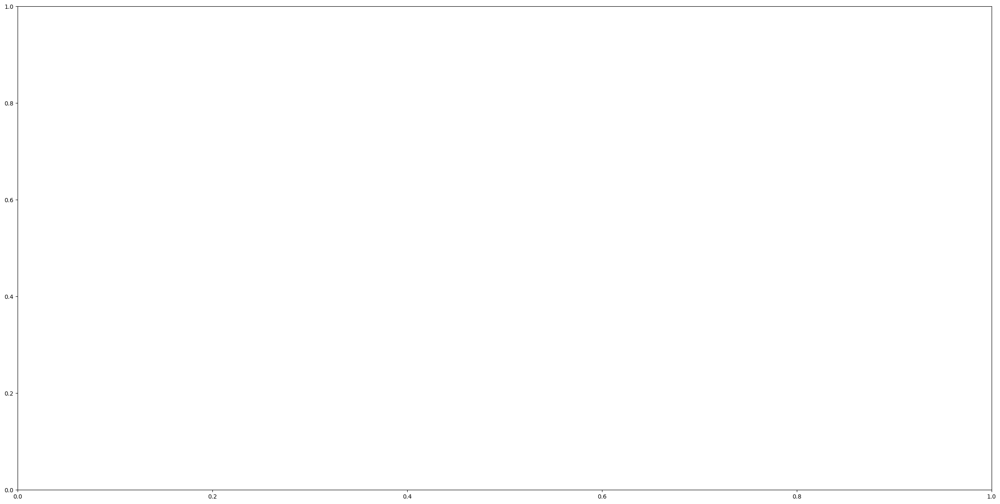

In [33]:
# Заголовок графика
print('-' * 150)
print('График метода локтя для выбора "K".')



# Строим график
plt.rcParams['figure.figsize'] = (30, 15)

plt.plot(
    list(K_values)[1:],
    labels_list,
    marker = 'o',
    linestyle = '-',
    label = 'WCSS'
)

plt.title('Метод локтя для выбора "K"', fontsize = 20)
plt.xlabel('Число кластеров (K)', fontsize = 15)
plt.ylabel('Значения WCSS', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.legend()
plt.show()

Обучим модель с подобранным количеством кластеров на декомпозированных данных:

In [34]:
# Создаём объект класса KMeans
KM_model = cluster.KMeans(
    n_clusters = 3,
    random_state = 42
)

# Обучаем модель
KM_model.fit(SD_df_pca)



# Выведем группы, а также количества входящих сигналов
SD_df_pca.loc[:, 'label'] = KM_model.labels_
print(f'Группы, а также количества входящих сигналов:\n\n{SD_df_pca.label.value_counts()}')

Группы, а также количества входящих сигналов:

label
0    18692
2     3687
1     1100
Name: count, dtype: int64


Визуализируем результаты кластеризации:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


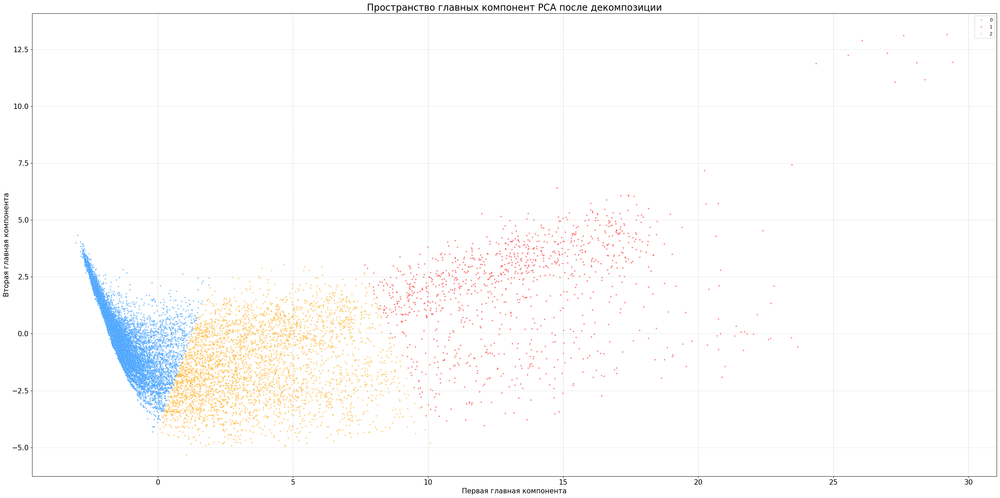

In [35]:
# Применяем функцию 'clusters_visualization_matplotlib' к 'SD_df_pca'
clusters_visualization_matplotlib(
    data = SD_df_pca,
    hue = KM_model.labels_,
    palette = ['dodgerblue', 'red', 'orange']
)

**Вывод:**



#### $6.2$

#### **Gaussian Mixture Models (GMM)**

Теперь возьмём `EM`-алгоритм.

Подберём оптимальное количество кластеров для `EM`-алгоритма (`GaussianMixture`) с помощью коэффициента силуэта, перебирая возможные значения от $2$ до $10$ включительно. В качестве значения параметра *random_state* возьмём число $42$. Остальные параметры оставим по умолчанию:

In [36]:
# Проходимся циклом по всем нужным нам значениям количества кластеров
for silhouette in range(2, 11):
    
    # Создаём объект класса GaussianMixture
    GM_model = mixture.GaussianMixture(
        n_components = silhouette,
        random_state = 42
    )
    
    # Обучаем модель и предсказываем метки
    GM_predict = GM_model.fit_predict(SD_df_pca)
    
    # Выводим результат для коэффициента силуэта
    print('Результат коэффициента силуэта {}: {:.2f}'.format(silhouette, metrics.silhouette_score(SD_df_pca, GM_predict)))
    print('-' * 40)

Результат коэффициента силуэта 2: 0.67
----------------------------------------
Результат коэффициента силуэта 3: 0.66
----------------------------------------
Результат коэффициента силуэта 4: 0.37
----------------------------------------
Результат коэффициента силуэта 5: 0.35
----------------------------------------
Результат коэффициента силуэта 6: 0.36
----------------------------------------
Результат коэффициента силуэта 7: 0.36
----------------------------------------
Результат коэффициента силуэта 8: 0.23
----------------------------------------
Результат коэффициента силуэта 9: 0.13
----------------------------------------
Результат коэффициента силуэта 10: 0.12
----------------------------------------


Обучим модель с подобранным количеством кластеров на декомпозированных данных:

In [37]:
# Создаём объект класса 'GaussianMixture'         
GM_model = mixture.GaussianMixture(
    n_components = 3,
    random_state = 42
)

# Обучаем модель и предсказываем метки
GM_predict = GM_model.fit_predict(SD_df_pca)



# Выведем группы, а также количества входящих сигналов
SD_df_pca.loc[:, 'label'] = GM_predict
print(f'Группы, а также количества входящих сигналов:\n\n{SD_df_pca.label.value_counts()}')

Группы, а также количества входящих сигналов:

label
0    18692
2     3687
1     1100
Name: count, dtype: int64


C:\Users\User\AppData\Local\Temp\ipykernel_19072\3005744176.py:13: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0 0 0 ... 2 0 1]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  SD_df_pca.loc[:, 'label'] = GM_predict


Визуализируем результаты кластеризации:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


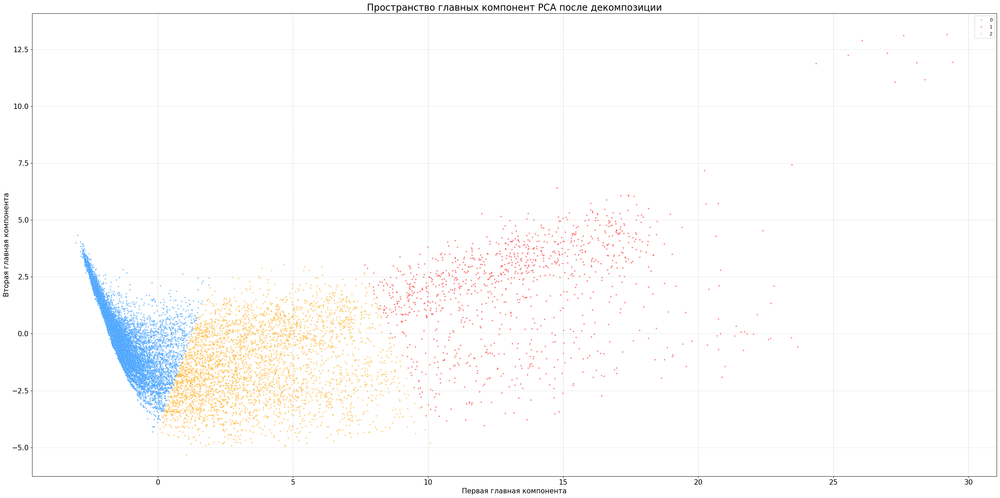

In [38]:
# Применяем функцию 'clusters_visualization_matplotlib' к 'SD_df_pca'
clusters_visualization_matplotlib(
    data = SD_df_pca,
    hue = GM_predict,
    palette = ['dodgerblue', 'red', 'orange']
)

**Вывод:**



#### $6.3$

#### **DBSCAN**

Воспользуемся моделью `DBSCAN`.

Для начала, построим график для подбора оптимального значения параметра `eps` для алгоритма `DBSCAN`:

------------------------------------------------------------------------------------------------------------------------------------------------------
График подбора оптимального значения eps.


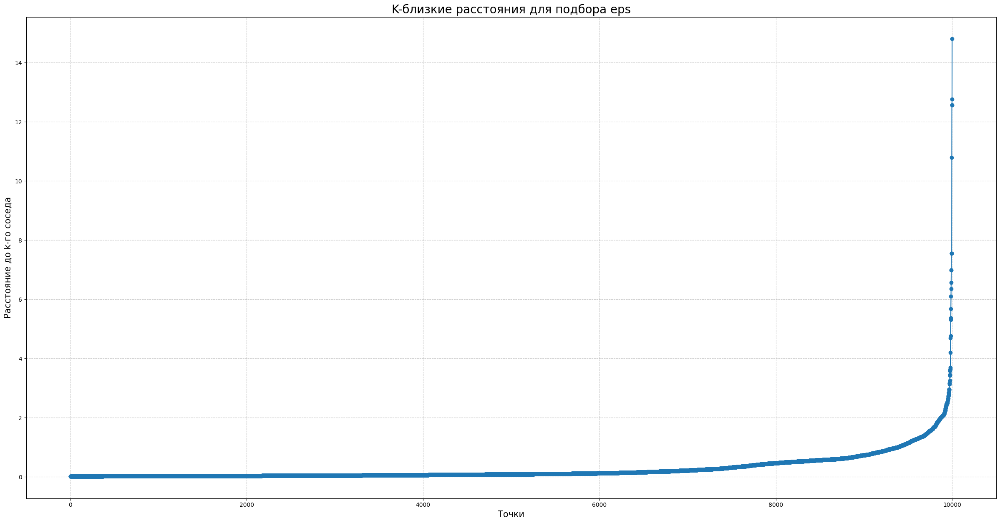

In [39]:
# Заголовок графика
print('-' * 150)
print('График подбора оптимального значения eps.')



# Создаём подвыборку из 10000 строк
# (для ускорения вычислений)
sample_size = 10000
np.random.seed(42)
sample_indices = np.random.choice(SD_df_pca.shape[0], size = sample_size)
SD_df_sample = SD_df_pca.iloc[sample_indices]  



# Вычисляем расстояния
k = 50    # min_samples
NN_method = neighbors.NearestNeighbors(n_neighbors = k, algorithm = 'auto')
NN_method.fit(SD_df_sample)
distances, indices = NN_method.kneighbors(SD_df_sample)
distances = np.sort(distances[:, k - 1])



# Строим график
plt.rcParams['figure.figsize'] = (30, 15) 

plt.plot(
    distances,
    marker = 'o',
    linestyle = '-'
)

plt.title('K-близкие расстояния для подбора eps', fontsize = 20)
plt.xlabel('Точки', fontsize = 15)
plt.ylabel('Расстояние до k-го соседа', fontsize = 15)
plt.grid(True, linestyle = '--', alpha = 0.7)
plt.show()

**Вывод:**

Оптимальное значение `eps` находится в диапазоне 8-10.

Чтобы точнее определить значение, посмотрим на значения расстояний в массиве `distances`:

In [40]:
# Смотрим значения вокруг "локтя"
print(f'Расстояния в районе 8000-й точки:\n\n{distances[8000: 10000]}')
print('-' * 70)

Расстояния в районе 8000-й точки:

[ 0.47023156  0.47049288  0.47057969 ... 12.56643783 12.77026982
 14.80533322]
----------------------------------------------------------------------


Переберём различные значения `eps`:

In [41]:
# Перебираем значения eps и вычисляем количество кластеров
for eps in range(2, 11):
    
    
    # Создаём объект класса DBSCAN
    DBSCAN_model = cluster.DBSCAN(
        eps = eps,
        min_samples = 5, 
        metric = 'euclidean',
        n_jobs = -1
    )
    
    # Обучаем модель DBSCAN
    DBSCAN_labels = DBSCAN_model.fit_predict(SD_df_pca)
    
    
    # Вычисляем количество кластеров и шумовых точек
    n_clusters = len(set(DBSCAN_labels)) - (1 if -1 in DBSCAN_labels else 0)
    n_noise = list(DBSCAN_labels).count(-1)
    
    
    # Выводим результаты
    print('-' * 60)
    print(f'eps = {eps}:')
    print(f'DBSCAN: {n_clusters} кластеров, {n_noise} шумовых точек ({n_noise / len(DBSCAN_labels) * 100:.2f}%)')
    
    if n_clusters > 1:
        mask = DBSCAN_labels != -1
        
        if sum(mask) > 0:
            sil_score = metrics.silhouette_score(SD_df_pca[mask], DBSCAN_labels[mask])
            print(f'Silhouette Score: {sil_score:.4f}')
            
    else:
        print('Слишком мало кластеров для вычисления Silhouette Score.')

------------------------------------------------------------
eps = 2:
DBSCAN: 3 кластеров, 1 шумовых точек (0.00%)
Silhouette Score: 0.6707
------------------------------------------------------------
eps = 3:
DBSCAN: 2 кластеров, 1 шумовых точек (0.00%)
Silhouette Score: 0.8521
------------------------------------------------------------
eps = 4:
DBSCAN: 2 кластеров, 0 шумовых точек (0.00%)
Silhouette Score: 0.8520
------------------------------------------------------------
eps = 5:
DBSCAN: 1 кластеров, 0 шумовых точек (0.00%)
Слишком мало кластеров для вычисления Silhouette Score.
------------------------------------------------------------
eps = 6:
DBSCAN: 1 кластеров, 0 шумовых точек (0.00%)
Слишком мало кластеров для вычисления Silhouette Score.
------------------------------------------------------------
eps = 7:
DBSCAN: 1 кластеров, 0 шумовых точек (0.00%)
Слишком мало кластеров для вычисления Silhouette Score.
------------------------------------------------------------
eps = 

Берём значение `eps` = $2$, который дал $3$ кластера.

Строим модель:

In [42]:
# Создаём объект класса 'DBSCAN'           
DBSCAN_model = cluster.DBSCAN(
    eps = 2,
    min_samples = 5,
    metric = 'euclidean',
    n_jobs = -1
)

# Обучаем модель 'DBSCAN'
DBSCAN_labels = DBSCAN_model.fit_predict(SD_df_pca)



# Анализируем результаты
# Количество кластеров и шумовых точек
n_clusters = len(set(DBSCAN_labels)) - (1 if -1 in DBSCAN_labels else 0)
n_noise = list(DBSCAN_labels).count(-1)

# Выводим информацию о количестве кластеров и шумовых точек
print(f'DBSCAN: {n_clusters} кластеров, {n_noise} шумовых точек ({n_noise / len(DBSCAN_labels) * 100:.2f}%)')



# Вычисляем 'Silhouette Score'
if n_clusters > 1:
    mask = DBSCAN_labels != -1
    
    if sum(mask) > 0:
        sil_score = metrics.silhouette_score(SD_df_pca[mask], DBSCAN_labels[mask])
        print(f'Результат Silhouette Score: {sil_score:.4f}')
        
else:
    print('Слишком мало кластеров для вычисления Silhouette Score.')

DBSCAN: 3 кластеров, 1 шумовых точек (0.00%)
Результат Silhouette Score: 0.6707


Визуализируем результаты кластеризации:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


C:\Users\User\AppData\Local\Temp\ipykernel_19072\3374475018.py:15: UserWarning: 
The palette list has fewer values (3) than needed (4) and will cycle, which may produce an uninterpretable plot.
  sns.scatterplot(


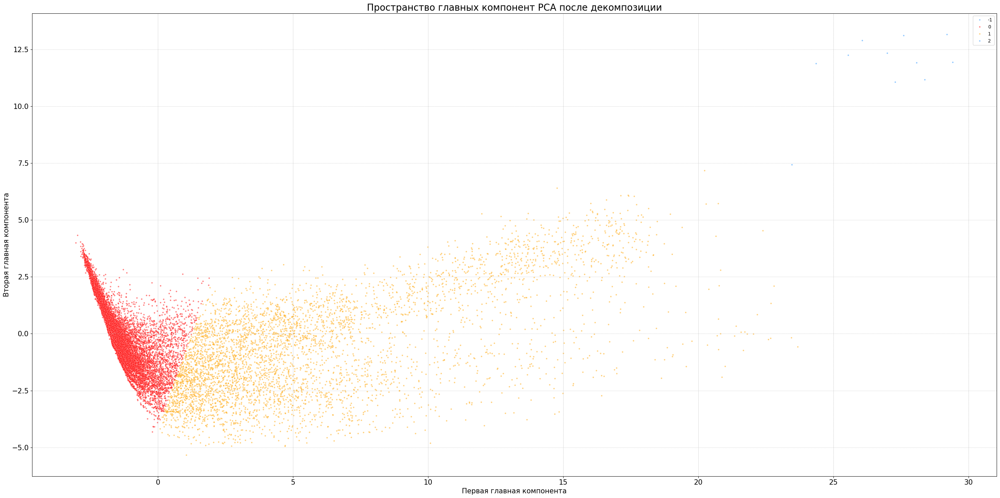

In [43]:
# Применяем функцию 'clusters_visualization_matplotlib' к 'SD_df_pca'
clusters_visualization_matplotlib(
    data = SD_df_pca,
    hue = DBSCAN_labels,
    palette = ['dodgerblue', 'red', 'orange']
)

По данному графику очень сложно рассмотреть 3-й кластер.

Попробуем построить график при помощи библиотеки `plotly`:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


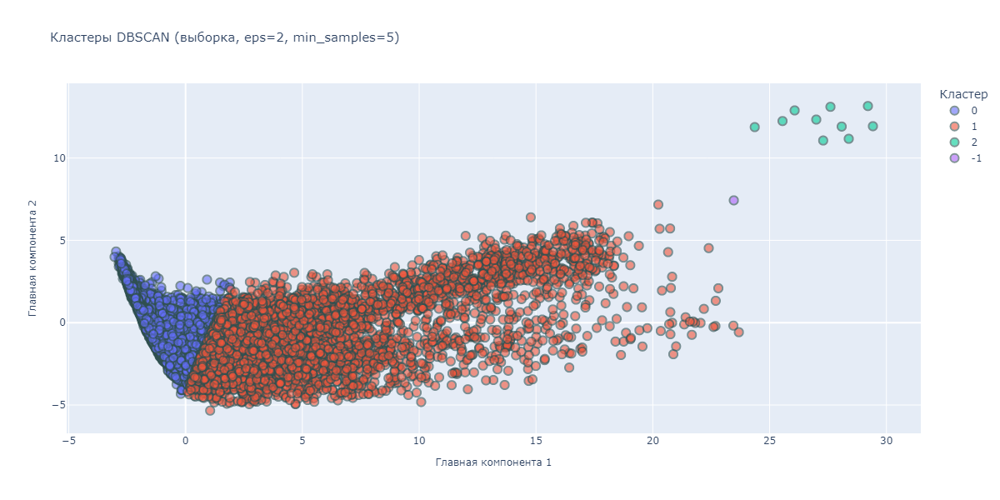

In [44]:
# Для визуализации воспользуемся функцией 'clusters_visualization_px'
clusters_visualization_px(
    data = SD_df_pca,
    labels = DBSCAN_labels,
    title = 'Кластеры DBSCAN (выборка, eps=2, min_samples=5)'
)

Построим гистограмму распределения кластеров:

------------------------------------------------------------------------------------------------------------------------------------------------------
Столбчатая гистограмма распределения кластеров:


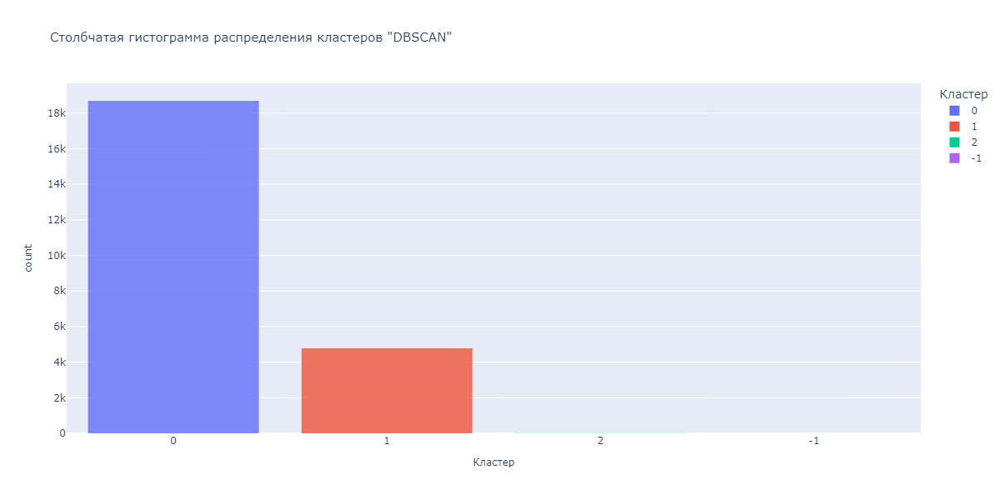

In [45]:
# Для визуализации воспользуемся функцией 'clusters_visualization_hist_px'
clusters_visualization_hist_px(
    data = SD_df_pca,
    labels = DBSCAN_labels,
    title = 'Столбчатая гистограмма распределения кластеров "DBSCAN"'
)

**Вывод:**



#### $6.4$

#### **HDBSCAN**

Воспользуемся алгоритмом `HDBSCAN`, так как он автоматически определяет количество кластеров и хорошо работает с данными сложной структуры:

In [ ]:
# Создаём объект класса 'HDBSCAN'     
HDBSCAN_model = cluster.HDBSCAN(
    min_cluster_size = 10,
    min_samples = 5
)

# Обучаем модель и получаем метки кластеров
HDBSCAN_labels = HDBSCAN_model.fit_predict(SD_df_pca)



# Анализируем результаты
n_clusters = len(set(HDBSCAN_labels)) - (1 if -1 in HDBSCAN_labels else 0)
n_noise = list(HDBSCAN_labels).count(-1)

print(f'HDBSCAN: {n_clusters} кластеров, {n_noise} шумовых точек ({n_noise / len(HDBSCAN_labels) * 100:.2f}%)')



# Вычисляем 'Silhouette Score'
if n_clusters > 1:
    mask = HDBSCAN_labels != -1
    
    if sum(mask) > 0:
        sil_score = metrics.silhouette_score(SD_df_pca[mask], HDBSCAN_labels[mask])
        
        print(f'Значения "Silhouette Score" для HDBSCAN: {sil_score:.4f}')

HDBSCAN: 408 кластеров, 8218 шумовых точек (35.00%)
Значения Silhouette Score для HDBSCAN: 0.2913


`HDBSCAN` выделил слишком много кластеров ($408$ кластеров), что указывает на то, что алгоритм слишком чувствителен к локальным плотностям.

Поскольку модель создала слишком много кластеров, нужно объединить их в $3$. Для этого используем алгоритм `K-Means`:

In [47]:
# Исключаем шум
non_noise_mask = HDBSCAN_labels != -1
non_noise_data = SD_df_pca[non_noise_mask]
non_noise_labels = HDBSCAN_labels[non_noise_mask]



# Применяем K-Means для объединения
kmeans = cluster.KMeans(
    n_clusters = 3,
    random_state = 42,
    n_init = 10
)

# Обучаем модель K-Means и получаем новые метки кластеров
new_labels = kmeans.fit_predict(non_noise_data)



# Обновляем метки
labels_updated = HDBSCAN_labels.copy()
labels_updated[non_noise_mask] = new_labels



# Анализируем результаты
n_clusters = len(set(labels_updated)) - (1 if -1 in labels_updated else 0)
n_noise = list(labels_updated).count(-1)

print(f'После объединения: {n_clusters} кластеров, {n_noise} шумовых точек ({n_noise / len(labels_updated) * 100:.2f}%)')



# Рассчитываем 'Silhouette Score'
if n_clusters > 1:
    mask = labels_updated != -1
    
    if sum(mask) > 0:
        sil_score = metrics.silhouette_score(SD_df_pca[mask], labels_updated[mask])
        
        print(f'Значение "Silhouette Score" после объединения: {sil_score:.4f}')

После объединения: 3 кластеров, 8218 шумовых точек (35.00%)
Значение "Silhouette Score" после объединения: 0.6342


Теперь, используя параметры `HDBSCAN` и объединённые метки, примени их ко всем данным через классификатор `RandomForestClassifier`:

In [48]:
# Обучаем классификатор на выборке
RFC_model = ensemble.RandomForestClassifier(
    n_estimators = 100,
    random_state = 42
)

# Обучаем модель на подвыборке
RFC_model.fit(SD_df_pca, labels_updated)

# Предсказываем для всех данных
RFC_labels = RFC_model.predict(SD_df_pca)



# Анализируем результаты
unique, counts = np.unique(RFC_labels, return_counts = True)
print("Распределение точек по кластерам:", dict(zip(unique, counts)))

Распределение точек по кластерам: {-1: 8218, 0: 3665, 1: 10511, 2: 1085}


Построим точечный график:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


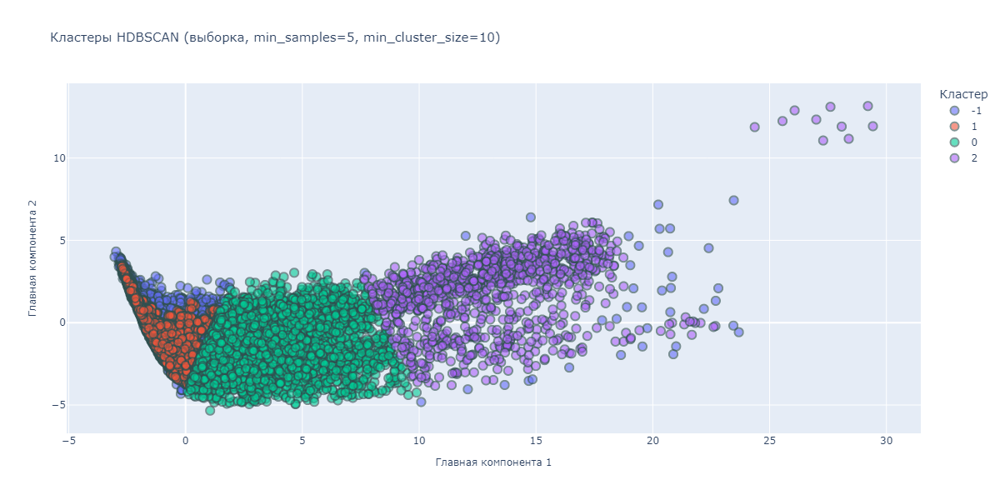

In [49]:
# Для визуализации воспользуемся функцией 'clusters_visualization_px'
clusters_visualization_px(
    data = SD_df_pca,
    labels = RFC_labels,
    title = 'Кластеры HDBSCAN (выборка, min_samples=5, min_cluster_size=10)'
)

Построим гистограмму:

------------------------------------------------------------------------------------------------------------------------------------------------------
Столбчатая гистограмма распределения кластеров:


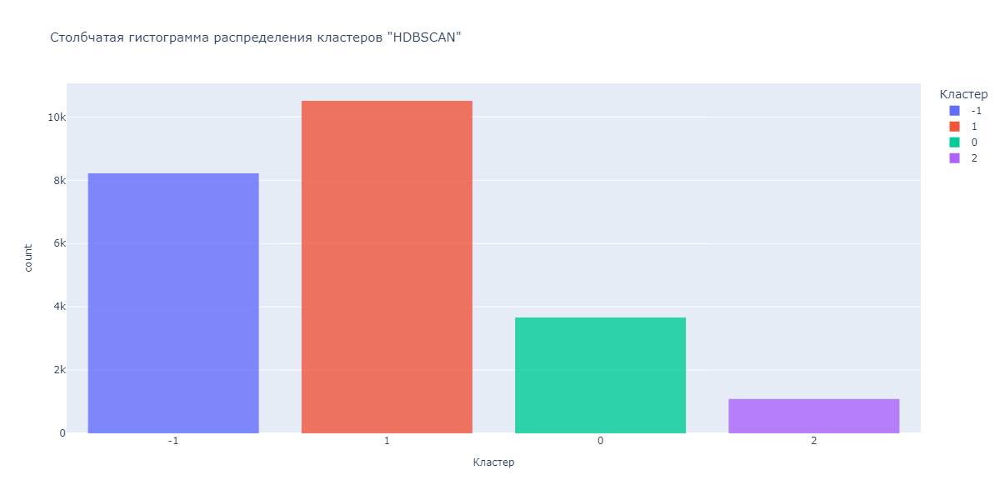

In [50]:
# Для визуализации воспользуемся функцией 'clusters_visualization_hist_px'
clusters_visualization_hist_px(
    data = SD_df_pca,
    labels = RFC_labels,
    title = 'Столбчатая гистограмма распределения кластеров "HDBSCAN"'
)

**Вывод:**



#### $6.5$

#### **Иерархическая кластеризация (Agglomerative Clustering)**

Используем иерархическую кластеризацию, так как она позволяет понять структуру данных и выбрать количество кластеров с помощью дендрограммы.

Строим дендрограмму:

------------------------------------------------------------------------------------------------------------------------------------------------------
Дендрограмма кластеризации:


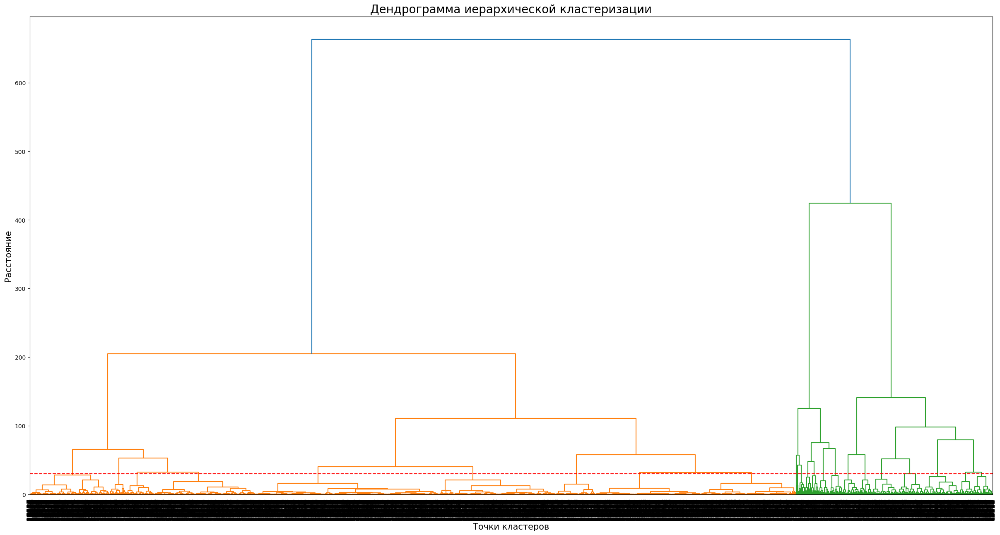

In [51]:
# Создаём заголовок для графика
print('-' * 150)
print('Дендрограмма кластеризации:')



# Вычисляем иерархическую кластеризацию
# используем метод Уорда для минимизации дисперсии
Z = linkage(SD_df_pca, method = 'ward')



# СЗадаём размер дендрограммы
plt.figure(figsize = (30, 15))

# Строим дендрограмму
dendrogram(
    Z, 
    p = 20,
    leaf_rotation = 90, 
    leaf_font_size = 12,
    show_contracted = True
)

plt.title('Дендрограмма иерархической кластеризации', fontsize = 20)
plt.xlabel('Точки кластеров', fontsize = 15)
plt.ylabel('Расстояние', fontsize = 15)
plt.axhline(y = 30, color = 'r', linestyle = '--', label = 'Пороговое расстояние')
plt.show()

Подберём оптимальное количество кластеров:

In [52]:
# Пробуем разное количество кластеров (от 2 до 10)
for n_clusters in range(2, 11):
    
    # Создаём объект класса 'AgglomerativeClustering'
    AGG_model = cluster.AgglomerativeClustering(
        n_clusters = n_clusters,
        linkage = 'ward',
        metric = 'euclidean'
    )
    
    # Обучаем модель и получаем метки кластеров
    AGG_labels = AGG_model.fit_predict(SD_df_pca)
    sil_score = metrics.silhouette_score(SD_df_pca, AGG_labels)
    
    # Выводим значения 'Silhouette Score'
    print(f'Значения "Silhouette Score" для {n_clusters} кластеров: {sil_score:.4f}')
    print('-' * 55)

Значения "Silhouette Score" для 2 кластеров: 0.6734
-------------------------------------------------------
Значения "Silhouette Score" для 3 кластеров: 0.6633
-------------------------------------------------------
Значения "Silhouette Score" для 4 кластеров: 0.4961
-------------------------------------------------------
Значения "Silhouette Score" для 5 кластеров: 0.4844
-------------------------------------------------------
Значения "Silhouette Score" для 6 кластеров: 0.4831
-------------------------------------------------------
Значения "Silhouette Score" для 7 кластеров: 0.4036
-------------------------------------------------------
Значения "Silhouette Score" для 8 кластеров: 0.4075
-------------------------------------------------------
Значения "Silhouette Score" для 9 кластеров: 0.4101
-------------------------------------------------------
Значения "Silhouette Score" для 10 кластеров: 0.4119
-------------------------------------------------------


Так как в задаче необходимо разделить данные на $3$ кластера, возьмём значение $3$.

Вычисляем иерархическую кластеризацию:

In [53]:
# Создаём объект класса 'AgglomerativeClustering'        
AGG_model = cluster.AgglomerativeClustering(
    n_clusters = 3,
    linkage = 'ward',
    metric = 'euclidean'
)

# Обучаем модель и получаем метки кластеров
AGG_labels = AGG_model.fit_predict(SD_df_pca)



# Подсчёт 'Silhouette Score'
sil_score = metrics.silhouette_score(SD_df_pca, AGG_labels)
print(f'Значение "Silhouette Score" для иерархической кластеризации (3 кластера): {sil_score:.4f}')

# Проверяем количество точек в каждом кластере
unique, counts = np.unique(AGG_labels, return_counts = True)
print(f'Распределение точек по кластерам: {dict(zip(unique, counts))}')

Значение "Silhouette Score" для иерархической кластеризации (3 кластера): 0.6633
Распределение точек по кластерам: {0: 18692, 1: 3655, 2: 1132}


Строим точечный график:

------------------------------------------------------------------------------------------------------------------------------------------------------
Диаграмма рассеяния для выделения кластеров:


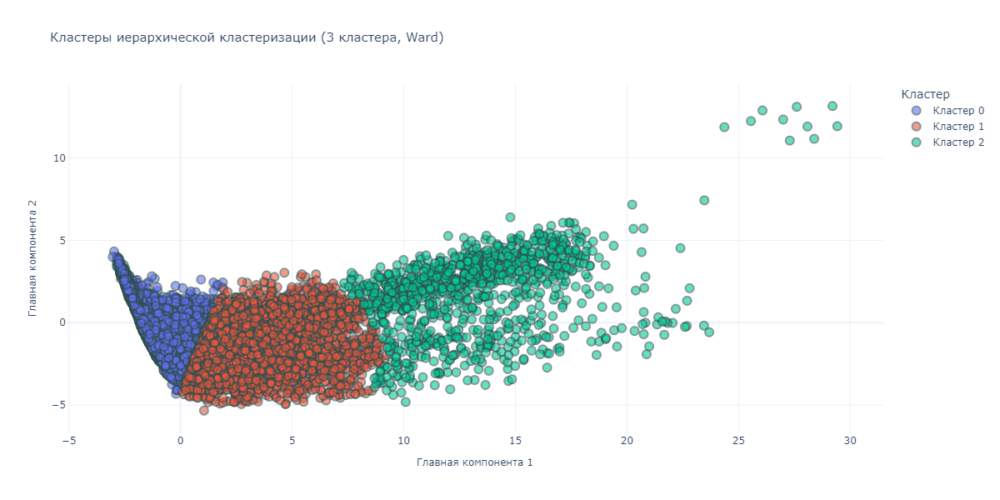

In [54]:
# Для визуализации воспользуемся функцией 'clusters_visualization_go'
clusters_visualization_go(
    data = SD_df_pca,
    labels = AGG_labels,
    title = 'Кластеры иерархической кластеризации (3 кластера, Ward)'
)

Строим столбчатую гистограмму:

------------------------------------------------------------------------------------------------------------------------------------------------------
Столбчатая гистограмма распределения кластеров:


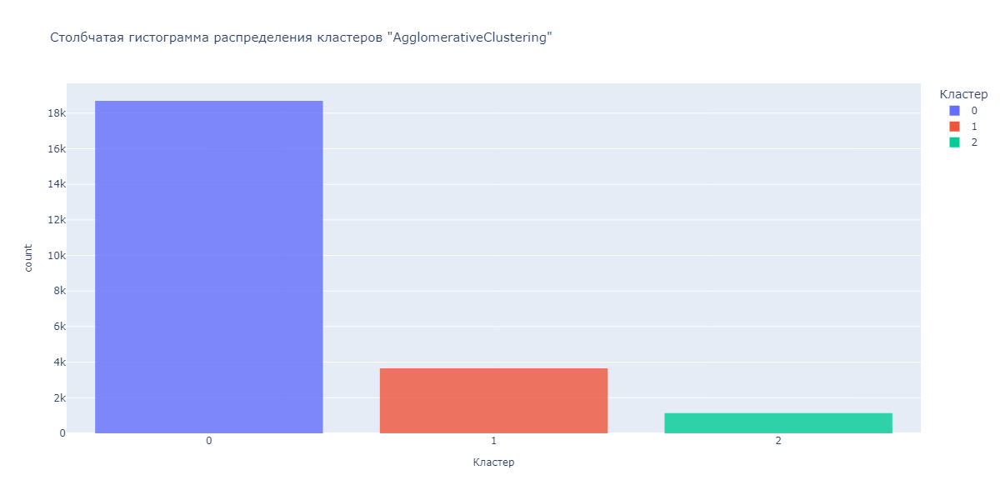

In [55]:
# Для визуализации воспользуемся функцией 'clusters_visualization_hist_px'
clusters_visualization_hist_px(
    data = SD_df_pca,
    labels = AGG_labels,
    title = 'Столбчатая гистограмма распределения кластеров "AgglomerativeClustering"'
)

##### **Вывод:**

Наилучшие значения параметров показала модель `AgglomerativeClustering`.

#### $6.6$

Для составления профиля кластеров необходимо вернуться от декомпозированных данных к `SD_df_cleaned`-таблице, очищенной от высококоррелированных связей. Сгруппируем `SD_df_cleaned`-таблицу по полученным кластерам и рассчитаем среднее по каждому из признаков:

In [56]:
# Создаём столбец содержащий кластеры
labels = pd.Series(
    data = AGG_model.labels_.astype('str'),
    index = SD_df_pca.index
)


# Производим группировку
cluster_pca_grouped = SD_df_cleaned.groupby(labels).mean().round(0)

Визуализируем профили кластеров в виде полярной диаграммы на основе средних характеристик, вычисленных для каждого кластера:

------------------------------------------------------------------------------------------------------------------------------------------------------
Полярная диаграмма распределения кластеров:


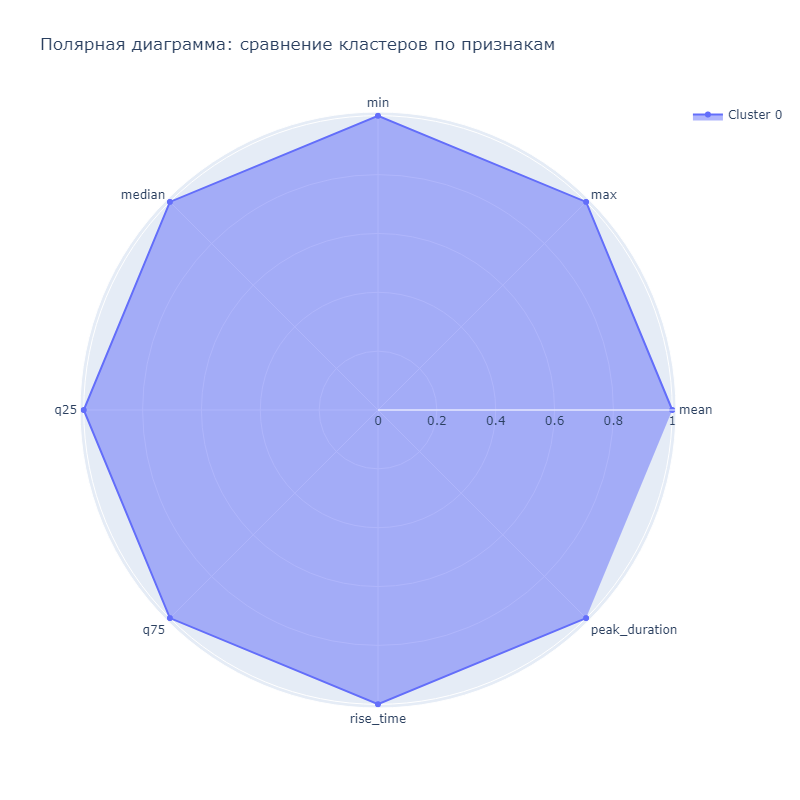

---------------------------------------------------------------------------------------------------------


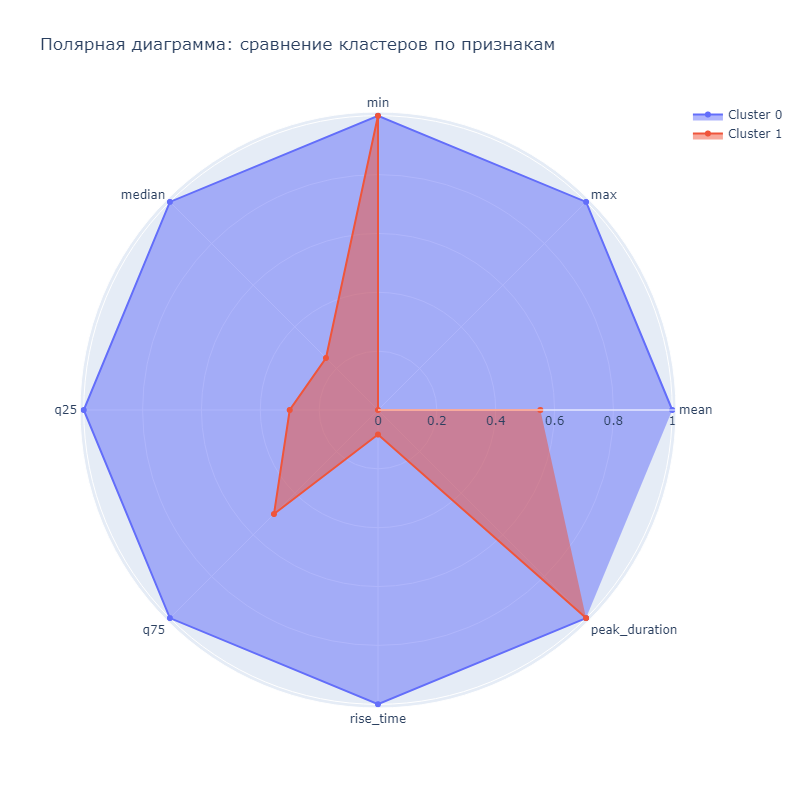

---------------------------------------------------------------------------------------------------------


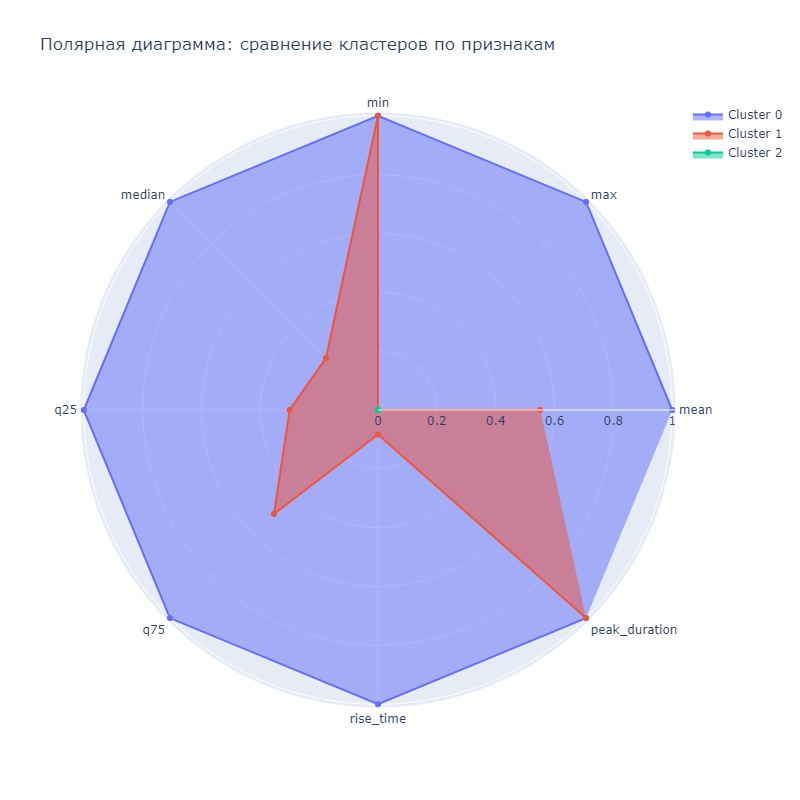

---------------------------------------------------------------------------------------------------------


In [57]:
# Для визуализации воспользуемся функцией 'plot_cluster_profile'
plot_cluster_profile(
    data = cluster_pca_grouped,
    n_clusters = 3
)

**Вывод:**



## <CENTER> **`7.` Machine Learning (classical)**

На данном этапе мы построим несколько подходящих моделей классического ML и выявим наилучшую.

Сведём задачу кластеризации к задаче классификации. Обучим модель, которая на основе полученных характеристик будет предсказывать тип поступащего сигнала.

#### $7.1$

**Разделим данные на обучающую `X_train` и валидационную `X_valid` выборки, а также выделим целевую переменную `y`.**

Разделим данные на матрицу наблюдений и вектор правильных ответов:

In [58]:
# Создаём матрицу наблюдений X и вектор правильных ответов y
X = SD_df_cleaned   # очищенная отвысококоррелированных связей таблица
y = labels          # метки кластеров, предсказанные ранее

Теперь разделим данные на обучающую и валидационную выборки:

In [59]:
# Разделяем X на тренировочную и валидационную выборки (70% на тренировку, 30% на валидацию)
X_train, X_valid, y_train, y_valid = model_selection.train_test_split(
    X, y,
    test_size = 0.3,
    random_state = 42,
    stratify = y
)


# Выведем итоговые размерности
print('Размер тренировочной выборки: {}'.format(X_train.shape))
print('Размер валидационной выборки: {}'.format(X_valid.shape))

Размер тренировочной выборки: (16435, 8)
Размер валидационной выборки: (7044, 8)


Далее построим несколько моделей и выберем из них лучшую.

Воспользуемся ансамблевыми алгоритмами.

#### $7.2$

**Сбалансируем классы.**

Выведем размерности тренировочной выборки и целевой переменной:

In [60]:
# Выводим размеры тренировочной выборки
print('Данные имеют следующую размерность:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.\n'.format(X_train.shape[0], X_train.shape[1]))


# Выводим распределение целевой переменной
print(f'Распределение класса:\n{y_train.value_counts()}')

Данные имеют следующую размерность:

Количество строк: 16435;
Количество признаков (столбцов): 8.

Распределение класса:
0    13084
1     2559
2      792
Name: count, dtype: int64


Создадим функцию для построения графика распределения целевого признака:

In [61]:
# Создаём функцию для построения графика распределения целевой переменной
def target_distribution_plot(target, figsize = (30, 15)):
    
    
    """
    Функция для построения графика распределения целевой переменной.
    
    Параметры:
    - target: pandas Series с данными.
    - title: заголовок графика.
    - figsize: размер графика.
    
    """
    
    
    # Создаём заголовок для графика
    print('-' * 150)
    print('Стобчатая и круговая диаграммы распределения целевой переменной:')
    
    
    # Задаём размер графика
    fig, ax = plt.subplots(1, 2, figsize = figsize)
    
    # Гистограмма
    sns.countplot(
        x = target,
        ax = ax[0],
        palette = 'Set2',
        order = target.value_counts().index,
        edgecolor = 'black',
        linewidth = 1.5
    )
     
    # Настройка графика
    ax[0].set_xticklabels(
        target.value_counts().index, 
        fontsize = 15
    )
    
    ax[0].set_title('Распределение целевой переменной', fontsize = 20)
    ax[0].set_xlabel('Класс', fontsize = 15)
    ax[0].set_ylabel('Количество', fontsize = 15)
    plt.grid(True, linestyle = '--', alpha = 0.7)
    plt.tight_layout()



    # Кольцевая диаграмма
    target_counts = target.value_counts()

    wedges, texts, autotexts = ax[1].pie(
        target_counts,
        labels = target_counts.index,
        colors = sns.color_palette('Set2', 3),
        autopct = '%1.1f%%',
        startangle = 90
    )

    centre_circle = plt.Circle((0, 0), 0.70, fc = 'white')
    fig.gca().add_artist(centre_circle)
    ax[1].set_title('Распределение целевой переменной', fontsize = 20)



    # Выводим график
    plt.show()

Построим график распределения целевого признака:

------------------------------------------------------------------------------------------------------------------------------------------------------
Стобчатая и круговая диаграммы распределения целевой переменной:


C:\Users\User\AppData\Local\Temp\ipykernel_19072\660704962.py:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\User\AppData\Local\Temp\ipykernel_19072\660704962.py:35: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



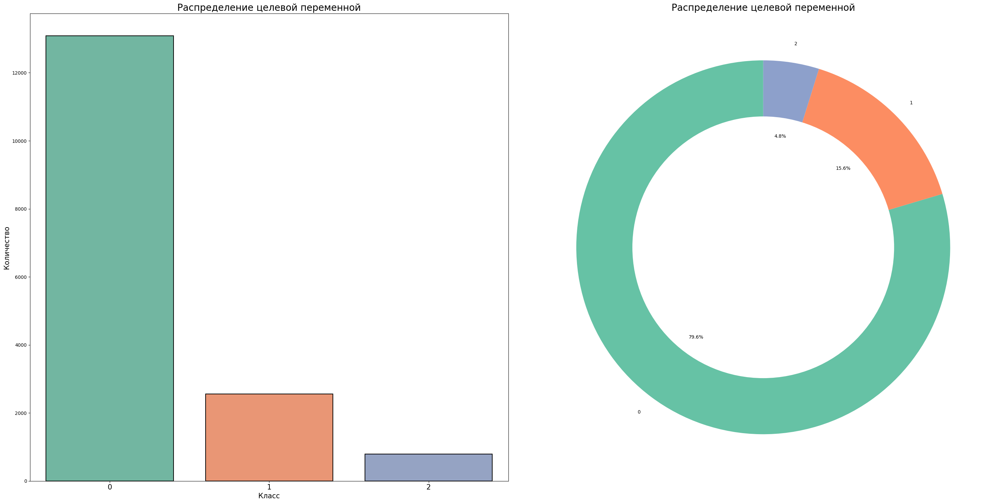

In [62]:
# Применяем функцию 'target_distribution_plot()' для построения графика распределения целевой переменной
target_distribution_plot(target = y_train)

Из построенной столбчатой диаграммы видно явный дисбаланс, особенно выделяется преобладание класса $6$ над остальными. Так же следует отметить класс $5$, у которого всего 158 строк (1.0%), из-за чего практически не представлен в данных.

Для дальнейшей работы требуется балансировка классов.

Сбалансируем классы. Для этого воспользуемся алгоритмом `RandomOverSampler`, который отлично подходит для случаев с экстремально малым количеством данных в классе:

In [63]:
# Импорт и инициализация 'RandomOverSampler'
ROS = over_sampling.RandomOverSampler(
    random_state = 0, 
    sampling_strategy = 'auto'
)

# Сохранение исходных названий столбцов
columns = X_train.columns

# Применение 'RandomOverSampler' для создания сбалансированных данных
X_train_ros, y_train_ros = ROS.fit_resample(X_train, y_train)

# Создание DataFrame для сбалансированных данных
X_train_ros = pd.DataFrame(X_train_ros, columns = columns)
y_train_ros = pd.DataFrame(y_train_ros, columns = ['labels'])



# Вывод информации о сбалансированных данных
print(f'Размерность данных после применения "RandomOverSampler": {X_train_ros.shape}')
print('-' * 65)
print()

print(f'Распределение классов после применения "RandomOverSampler":\n\n{y_train_ros.value_counts()}')
print('-' * 65)

Размерность данных после применения "RandomOverSampler": (39252, 8)
-----------------------------------------------------------------

Распределение классов после применения "RandomOverSampler":

labels
0         13084
1         13084
2         13084
Name: count, dtype: int64
-----------------------------------------------------------------


Построим график после устранения дисбаланса классов:

------------------------------------------------------------------------------------------------------------------------------------------------------
Стобчатая и круговая диаграммы распределения целевой переменной:


C:\Users\User\AppData\Local\Temp\ipykernel_19072\660704962.py:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.


C:\Users\User\AppData\Local\Temp\ipykernel_19072\660704962.py:35: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



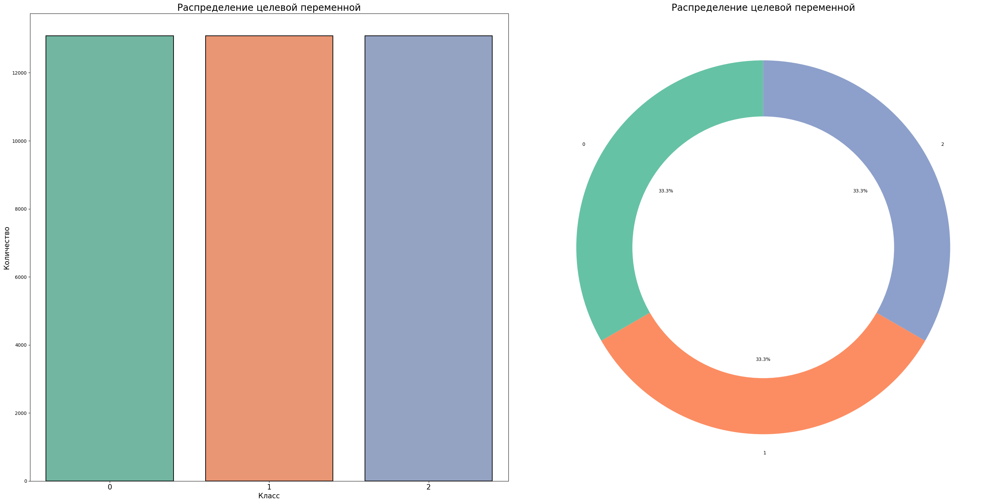

In [64]:
# Строим график распределения целевой переменной после "ROS"
target_distribution_plot(target = y_train_ros['labels'])

#### $7.3$

#### **RandomForestClassifier**

Начнём со случайного леса. С помощью *GridSearchCV* организуем перебор параметров случайного леса (*RandomForestClassifier*) на заданной сетке параметров:

In [78]:
# Задаём сетку гиперпараметров
param_grid = {
    'max_depth': range(5, 15),
    'criterion': ['gini', 'entropy'],
    'n_estimators': [100, 200, 500]
}



# Инициализируем поиск на сетке и обучаем его
GS_model = model_selection.GridSearchCV(
    
    estimator = ensemble.RandomForestClassifier(random_state = 42),
    param_grid = param_grid,
    scoring = 'accuracy',
    cv = 5,
    n_jobs = -1
)

# Обучаем модель и выводим наилучшие значения гиперпараметров
GS_model.fit(X_train_ros, y_train_ros.values.ravel())
print('Наилучшие значения гиперпараметров: {}'.format(GS_model.best_params_))

Наилучшие значения гиперпараметров: {'criterion': 'entropy', 'max_depth': 14, 'n_estimators': 200}


С помощью наилучшей модели сделаем предсказание для обучающей и тестовой выборок. Рассчитаем значение метрики `accuracy` на каждой из выборок. Ответы **округлим до трёх знаков после точки-разделителя**:

In [79]:
# Определяем наилучшую модель
best_model = GS_model.best_estimator_

# Делаем предсказание на тестовой выборке
y_valid_gs_pred = best_model.predict(X_valid)

# Считаем метрику accuracy на тестовой выборке
print('Метрика accuracy на тестовом наборе: {:.3f}'.format(metrics.accuracy_score(y_valid, y_valid_gs_pred)))

Метрика accuracy на тестовом наборе: 0.995


#### $7.4$

Сохраняем модель:

In [69]:
# Сохраняем модель при помощи joblib
joblib.dump(best_model, 'Random_Forest_model.pkl')
print('Модель обучена и сохранена в "Random_Forest_model.pkl"')

Модель обучена и сохранена в "Random_Forest_model.pkl"


Создаём файл для сабмишена:

In [89]:
# Создаём DataFrame для сабмишена
if 'id' in SD_df.columns:
    submission_df = pd.DataFrame({
        'index': SD_df['id'],
        'cluster': labels
    })
    
else:
    submission_df = pd.DataFrame({
        'index': SD_df.index,
        'cluster': labels
    })
    
    
    
# Проверяем созданный DataFrame
print('Первые 5 строк файла submission.csv:\n')
print('Количество строк: {};\nКоличество признаков (столбцов): {}.'.format(submission_df.shape[0], submission_df.shape[1]))

# Выведем первые пять строк 
display(submission_df.head())



# Сохраняем в CSV
submission_df.to_csv('submission.csv', index = False)
print('Файл "submission.csv" сохранён.')

Первые 5 строк файла submission.csv:

Количество строк: 23479;
Количество признаков (столбцов): 2.


,index,cluster
0,0,0
1,1,0
2,2,0
3,3,0
4,4,0


Файл "submission.csv" сохранён.
